In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import matplotlib.pyplot as plt
import seaborn as sns

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/chest-xray-pneumonia/chest_xray/chest_xray/.DS_Store
/kaggle/input/chest-xray-pneumonia/chest_xray/chest_xray/val/.DS_Store
/kaggle/input/chest-xray-pneumonia/chest_xray/chest_xray/val/PNEUMONIA/person1947_bacteria_4876.jpeg
/kaggle/input/chest-xray-pneumonia/chest_xray/chest_xray/val/PNEUMONIA/person1946_bacteria_4875.jpeg
/kaggle/input/chest-xray-pneumonia/chest_xray/chest_xray/val/PNEUMONIA/person1952_bacteria_4883.jpeg
/kaggle/input/chest-xray-pneumonia/chest_xray/chest_xray/val/PNEUMONIA/person1954_bacteria_4886.jpeg
/kaggle/input/chest-xray-pneumonia/chest_xray/chest_xray/val/PNEUMONIA/person1951_bacteria_4882.jpeg
/kaggle/input/chest-xray-pneumonia/chest_xray/chest_xray/val/PNEUMONIA/person1946_bacteria_4874.jpeg
/kaggle/input/chest-xray-pneumonia/chest_xray/chest_xray/val/PNEUMONIA/person1949_bacteria_4880.jpeg
/kaggle/input/chest-xray-pneumonia/chest_xray/chest_xray/val/PNEUMONIA/.DS_Store
/kaggle/input/chest-xray-pneumonia/chest_xray/chest_xray/val/PNEUMONIA/per

### Data

First, I would just load a few images to see what we're working with.

In [2]:
from keras.preprocessing.image import load_img, ImageDataGenerator
from PIL import Image
import cv2

### Dataset Preview

#### NORMAL

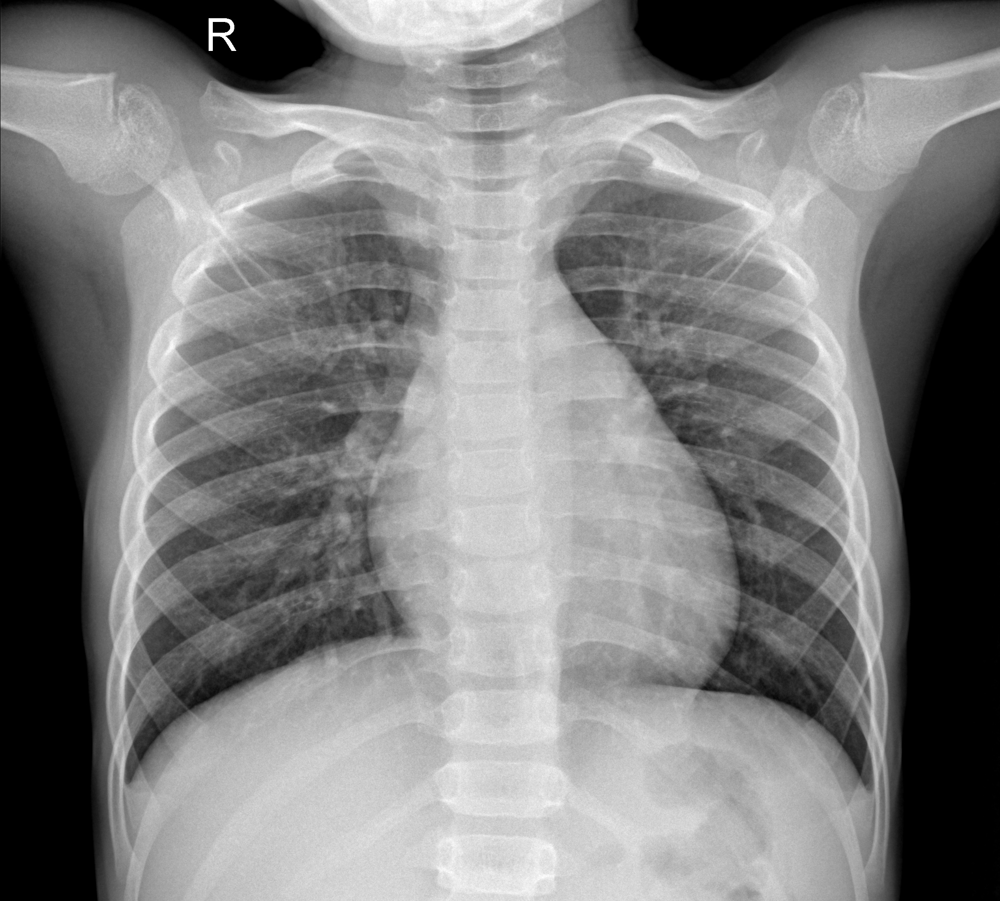

In [3]:
load_img('../input/chest-xray-pneumonia/chest_xray/train/NORMAL/IM-0143-0001.jpeg')

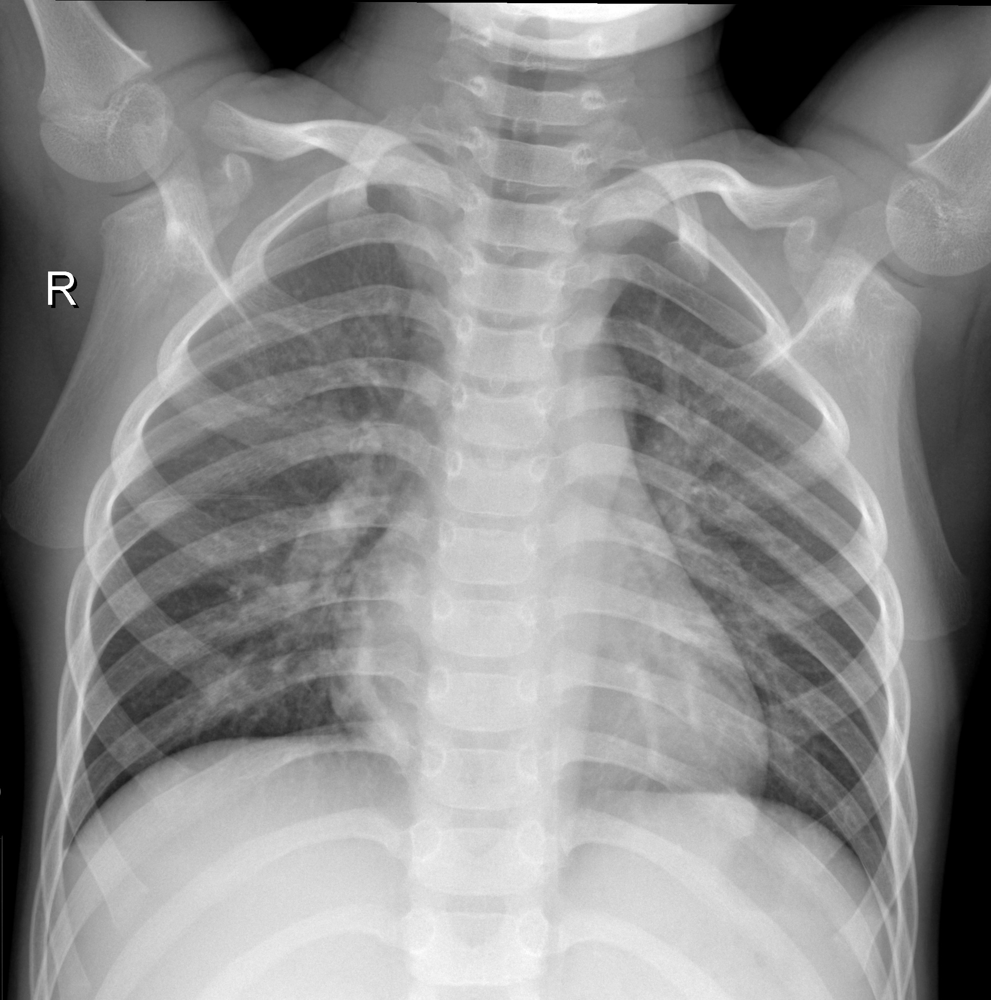

In [4]:
load_img('../input/chest-xray-pneumonia/chest_xray/train/NORMAL/IM-0172-0001.jpeg')

#### PNEUMONIA

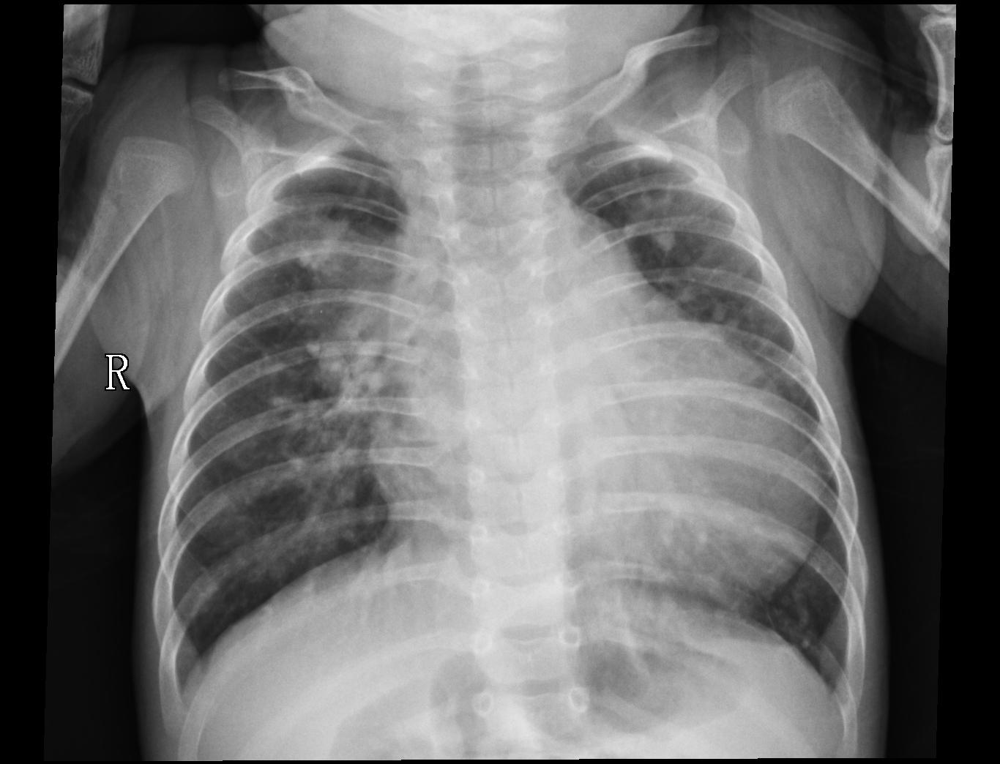

In [5]:
load_img('../input/chest-xray-pneumonia/chest_xray/train/PNEUMONIA/person1014_bacteria_2945.jpeg')

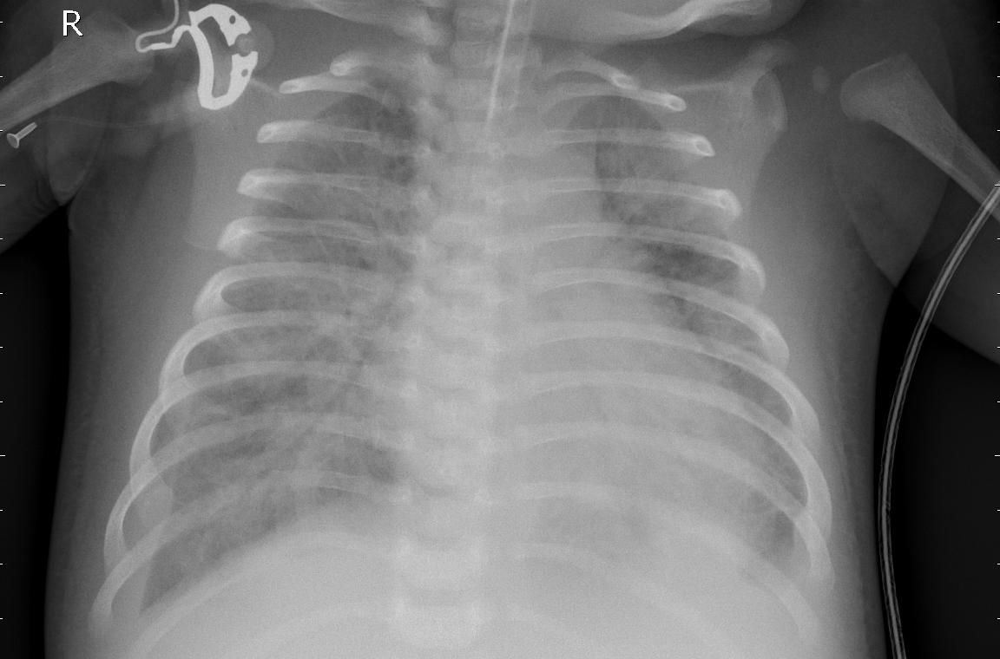

In [6]:
load_img('../input/chest-xray-pneumonia/chest_xray/train/PNEUMONIA/person1000_bacteria_2931.jpeg')

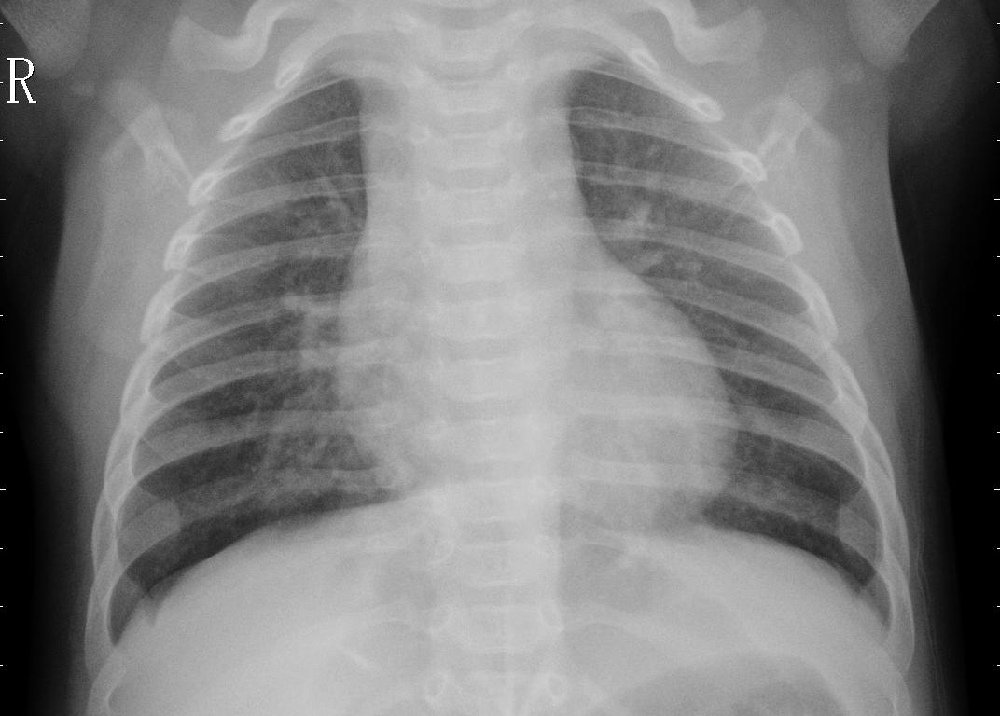

In [7]:
load_img('../input/chest-xray-pneumonia/chest_xray/train/PNEUMONIA/person1000_virus_1681.jpeg')

It looks like Pneumonia X-rays have a "cloudy" look with high opacity in the lungs area. The contrast between the bones and the lungs area seems to be higher in 'NORMAL' category X-rays, and you can almost see the lung vessels clearly. 

However, to be honest, some of the images in these 2 groups look quite similar, and it's not really easy for the untrained eyes to differentiate.

Next, I'll look at the dimensions of these images.

In [8]:
Image.open('../input/chest-xray-pneumonia/chest_xray/train/PNEUMONIA/person1000_bacteria_2931.jpeg').size

(1152, 760)

In [9]:
Image.open('../input/chest-xray-pneumonia/chest_xray/train/PNEUMONIA/person1015_virus_1701.jpeg').size

(1664, 1496)

In [10]:
Image.open('../input/chest-xray-pneumonia/chest_xray/train/NORMAL/IM-0128-0001.jpeg').size

(1528, 1013)

In [10]:
Image.open('../input/chest-xray-pneumonia/chest_xray/train/NORMAL/IM-0172-0001.jpeg').size

(1876, 1893)

It seems like the images are relatively large, with each dimension being roughly 1000-1800 pixels. They don't have uniform size, therefore, we'll need to rescale them later. 

### Checking number of channels for each image

In [11]:
img = cv2.imread('../input/chest-xray-pneumonia/chest_xray/train/NORMAL/IM-0172-0001.jpeg')

In [12]:
print(img.shape)

(1893, 1876, 3)


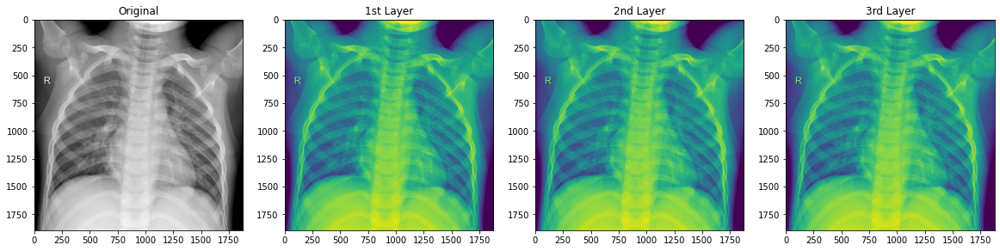

In [13]:
# DISPLAYING THE FIRST LAYER
fig, (ax1,ax2,ax3,ax4) = plt.subplots(nrows=1, ncols=4, figsize=(20,5))
ax1.imshow(img)
ax1.set_title('Original')

ax2.imshow(img[:, :, 0])
ax2.set_title('1st Layer')

ax3.imshow(img[:, :, 1])
ax3.set_title('2nd Layer')

ax4.imshow(img[:, :, 2])
ax4.set_title('3rd Layer');

These 3 layers look very similar to each other. Therefore I decided to compare the values of the pixels in each layer.

In [14]:
print((img[:, :, 0] == img[:, :, 1]).all())
print((img[:, :, 0] == img[:, :, 2]).all())

True
True


I am not entirely sure why these grayscale X-ray images have 3 channels or RGB, and the pixel values for all 3 layers are exactly the same. But because of this finding, I decided to set the `color_mode` to `grayscale` with `ImageDataGenerator()` to downsize the dataset, while retaining the same amount of information (maybe?).

## Generate Datasets

### Dataset Distribution

In order to look at the dataset distribution and evaluate its balance, I would create a dataframe with 2 columns:
- 1st column: name of the image file
- 2nd column: label for that image

In [15]:
import os
import glob
from pathlib import Path

In [16]:
# GET THE DIRECTORY TO THE DATASETS
path_data = '../input/chest-xray-pneumonia/chest_xray'
path_train = os.path.join(path_data, 'train')
path_val = os.path.join(path_data, 'val')
path_test = os.path.join(path_data, 'test')

# INITIATE EMPTY LIST OF TRAINING DATA
# THAT WILL BE CONVERTED TO PANDAS DATAFRAME LATER
data_train = []
data_val = []
data_test = []
data = [data_train, data_val, data_test]

# ITERATE THROUGH EACH PATH
for i, d in enumerate([path_train, path_val, path_test]):
    # GET THE PATH TO EACH FOLDER - NORMAL AND PNEUMONIA
    normal = os.path.join(d, 'NORMAL')
    pneumonia = os.path.join(d, 'PNEUMONIA')
    
    # FETCH ALL .jpeg FILES
    normal_imgs = Path(normal).glob('*.jpeg')
    pneumonia_imgs = Path(pneumonia).glob('*.jpeg')
    
    # APPEND THE NAME AND CORRESPONDING LABEL (BASED ON FOLDER NAME)
    # TO data_train list AS TUPLES
    for img in normal_imgs:
        data[i].append((str(img), 0))
    
    for img in pneumonia_imgs:
        data[i].append((str(img), 1))

In [17]:
# CONVERT data_train TO DATAFRAME FOR EASY MANIPULATION
columns = ['image', 'label']
train_df = pd.DataFrame(data_train, columns=columns)
val_df = pd.DataFrame(data_val, columns=columns)
test_df = pd.DataFrame(data_test, columns=columns)

In [18]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5216 entries, 0 to 5215
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   image   5216 non-null   object
 1   label   5216 non-null   int64 
dtypes: int64(1), object(1)
memory usage: 81.6+ KB


In [19]:
train_df.label.value_counts()

1    3875
0    1341
Name: label, dtype: int64

In [20]:
val_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16 entries, 0 to 15
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   image   16 non-null     object
 1   label   16 non-null     int64 
dtypes: int64(1), object(1)
memory usage: 384.0+ bytes


In [21]:
val_df.label.value_counts()

1    8
0    8
Name: label, dtype: int64

In [22]:
test_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 624 entries, 0 to 623
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   image   624 non-null    object
 1   label   624 non-null    int64 
dtypes: int64(1), object(1)
memory usage: 9.9+ KB


There are 5216 images in the training set, 624 in the testing set, and only 16 in validation (with a 1:1 Normal:Pneumonia ratio). 

Ideally, I would want more samples in the validation set than provided (16:5216 gives us a modest test size of 0.00305, and I would like something closer to 0.20). Therefore, I would later concatenate these these 2 datasets (`data_train` and `data_val`) and then splitting it at a test size of 0.20 during training.

I wonder if there's a purpose behind having a holdout validation set with only 16 samples and balanced classes though. From the above breakdown, I can see that the training set has a different class ratio (closer to 3:1), while the validation is at 1:1. If there is a way to do cross validation with different ratios in each round, that'd be interesting because it then would help us monitor how well the models are able to generalize to unseen data.

In [23]:
# CONCAT train_df and val_df
master_df = pd.concat([train_df, val_df])
# RESET INDEX (SO THERE WON'T BE ANY DUPLICATED INDICES) BY DROPPING OLD ONES
master_df.reset_index(inplace=True, drop=True)

In [24]:
master_df.tail(20)

,image,label
5212,../input/chest-xray-pneumonia/chest_xray/train...,1
5213,../input/chest-xray-pneumonia/chest_xray/train...,1
5214,../input/chest-xray-pneumonia/chest_xray/train...,1
5215,../input/chest-xray-pneumonia/chest_xray/train...,1
5216,../input/chest-xray-pneumonia/chest_xray/val/N...,0
5217,../input/chest-xray-pneumonia/chest_xray/val/N...,0
5218,../input/chest-xray-pneumonia/chest_xray/val/N...,0
5219,../input/chest-xray-pneumonia/chest_xray/val/N...,0
5220,../input/chest-xray-pneumonia/chest_xray/val/N...,0
5221,../input/chest-xray-pneumonia/chest_xray/val/N...,0


In [25]:
master_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5232 entries, 0 to 5231
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   image   5232 non-null   object
 1   label   5232 non-null   int64 
dtypes: int64(1), object(1)
memory usage: 81.9+ KB


In [26]:
# CHECK FOR DUPLICATES
master_df.duplicated().any()

False

In [27]:
master_df.sample(10, random_state=42)

,image,label
240,../input/chest-xray-pneumonia/chest_xray/train...,0
584,../input/chest-xray-pneumonia/chest_xray/train...,0
2259,../input/chest-xray-pneumonia/chest_xray/train...,1
1420,../input/chest-xray-pneumonia/chest_xray/train...,1
1835,../input/chest-xray-pneumonia/chest_xray/train...,1
80,../input/chest-xray-pneumonia/chest_xray/train...,0
3859,../input/chest-xray-pneumonia/chest_xray/train...,1
952,../input/chest-xray-pneumonia/chest_xray/train...,0
4431,../input/chest-xray-pneumonia/chest_xray/train...,1
1260,../input/chest-xray-pneumonia/chest_xray/train...,0


In [28]:
master_df.label.value_counts()

1    3883
0    1349
Name: label, dtype: int64

In [29]:
master_df.label.value_counts(normalize=True)

1    0.742164
0    0.257836
Name: label, dtype: float64

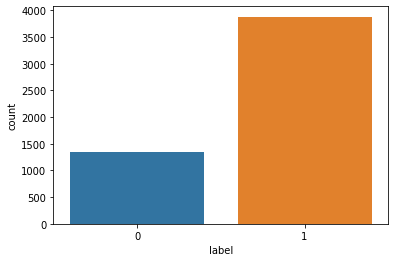

In [30]:
sns.countplot(x='label', data=master_df);

In [31]:
def cat_pneumonia_type(x):
    if 'bacteria' in x:
        output = 'bacteria'
    elif 'virus' in x:
        output = 'virus'
    else:
        output = 'normal'
    return output

In [32]:
master_df['type'] = master_df.image.apply(lambda x: cat_pneumonia_type(x))

In [33]:
master_df.type.value_counts()

bacteria    2538
normal      1349
virus       1345
Name: type, dtype: int64

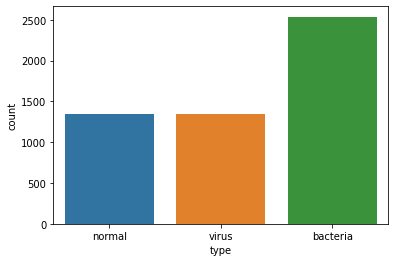

In [34]:
sns.countplot(x='type', data=master_df);

3,883 datapoints in our training dataset (which is the combination of `train` and `val` folders) are categorized as PNEUMONIA, which accounts for roughly 75% of the whole set. This means that we're working with a highly imbalanced dataset, and I would need to counter this by assigning class weights or incorporating some image augmentation methods later.

This also means that a model that predicts everything as PNEUMONIA would have approx. 75% accuracy (depending on the class ratio of the evaluation set this might vary). 

In [35]:
from sklearn.model_selection import train_test_split

In [36]:
# TRAIN VALIDATION SPLIT
train_df, val_df = train_test_split(master_df, test_size=0.2, random_state=42)

In [37]:
# MAKING SURE NONE OF THE SAMPLES IN val_df IS ALSO IN train_df
# TO AVOID DATA LEAKAGE
len(set(val_df.index) - set(train_df.index)) == len(val_df)

True

### Data Generators

In [38]:
BATCH_SIZE = 32

# CREATE GENERATOR FOR TRAINING DATA (FROM train_df DATAFRAME)
train_generator = ImageDataGenerator(rescale=1.0/255).flow_from_dataframe(
    dataframe=train_df, x_col='image', y_col='label',
    color_mode='grayscale',
    class_mode='raw',
    target_size=(180,180), 
    batch_size=BATCH_SIZE,
    seed=42,
    shuffle=True   # shuffle so we're not missing out on any samples
)

# CREATE GENERATOR FOR VALIDATION DATA (FROM val_df DATAFRAME)
val_generator = ImageDataGenerator(rescale=1.0/255).flow_from_dataframe(
    dataframe=val_df, x_col='image', y_col='label',
    color_mode='grayscale',
    class_mode='raw',
    target_size=(180,180), 
    batch_size=BATCH_SIZE,
    seed=42,
    shuffle=True
)

Found 4185 validated image filenames.
Found 1047 validated image filenames.


In [39]:
# CHECKING THE SHAPE OF 1 BATCH OF THE train_generator
images_train, labels_train = next(train_generator)
print(f'Training set: {images_train.shape} | {labels_train.shape}')

Training set: (32, 180, 180, 1) | (32,)


Each image is now 180 x 180 pixel. And each pixel is represented by only 1 value (as opposed to 3 channels like originally).

### Dataset Visualization
Next, I am going to display the first 16 images of the first batch with their corresponding labels:
- 0 - NORMAL 
- 1 - PNEUMONIA

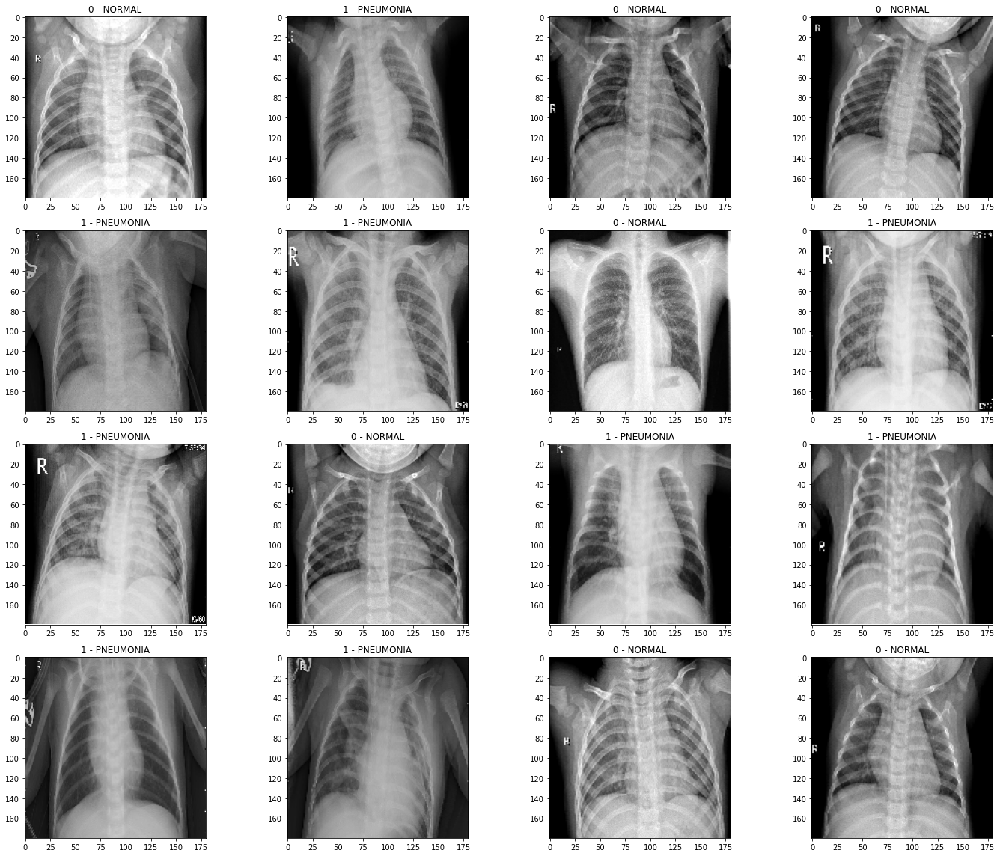

In [40]:
fig, axes = plt.subplots(nrows=4, ncols=4, figsize=(20,16))
label_output = {0: 'NORMAL', 1: 'PNEUMONIA'}
i = range(16)

for i in range(16):
    ax = axes[i // 4][i % 4]
    ax.imshow(images_train[i], cmap='gray')
    ax.set_title(f'{labels_train[i]} - {label_output[labels_train[i]]}')
    
plt.tight_layout()
plt.show();

# Modeling

In [41]:
from keras.models import Sequential, load_model
from keras.layers import Dense, Conv2D, Flatten, MaxPooling2D, Dropout
from keras.metrics import Recall, Precision
from sklearn.metrics import confusion_matrix, plot_confusion_matrix
from keras.callbacks import ModelCheckpoint, EarlyStopping
from keras.optimizers.schedules import ExponentialDecay

### Baseline Model

Next, I am going to construct a simple baseline Convolution Neural Networks (CNN) model with:
- 1 Layer of Convolution 2D with padding
- 1 Layer of MaxPooling 2D
- 1 Hidden Layer of Dense NN

(This architecture have been selected arbitrarily for the most part, and will be adjusted later).

In [46]:
baseline = Sequential()
baseline.add(Conv2D(32, (3,3), activation='relu', padding='same',
               input_shape=[180,180,1]))
baseline.add(MaxPooling2D(pool_size=(2,2)))
baseline.add(Flatten())
baseline.add(Dense(32, activation='relu'))
baseline.add(Dense(1, activation='sigmoid'))

In [54]:
recall = Recall()
precision = Precision()

In [47]:
baseline.compile(loss='binary_crossentropy',
                 optimizer='adam',
                 metrics=['accuracy', recall, precision])

In [ ]:
baseline.summary()

In [48]:
checkpoint_cb = ModelCheckpoint('baseline.h5',
                                save_best_only=True)
early_stopping_cb = EarlyStopping(patience=10,
                                  restore_best_weights=True)

BATCH_SIZE = 32
EPOCHS = 30

results_1 = baseline.fit(train_generator, 
                         validation_data=val_generator,
                         epochs=EPOCHS,
                         steps_per_epoch=(train_generator.n//BATCH_SIZE),
                         validation_steps=(val_generator.n//BATCH_SIZE),
                         callbacks=[checkpoint_cb, early_stopping_cb],
                         use_multiprocessing=True,
                         workers=8)

Epoch 1/30
130/130 [==============================] - 44s 285ms/step - loss: 1.1490 - accuracy: 0.7906 - recall: 0.9293 - precision: 0.8150 - val_loss: 0.1472 - val_accuracy: 0.9580 - val_recall: 0.9581 - val_precision: 0.9834
Epoch 2/30
130/130 [==============================] - 38s 277ms/step - loss: 0.1421 - accuracy: 0.9458 - recall: 0.9721 - precision: 0.9558 - val_loss: 0.0962 - val_accuracy: 0.9668 - val_recall: 0.9864 - val_precision: 0.9680
Epoch 3/30
130/130 [==============================] - 38s 279ms/step - loss: 0.0917 - accuracy: 0.9659 - recall: 0.9787 - precision: 0.9763 - val_loss: 0.0961 - val_accuracy: 0.9658 - val_recall: 0.9852 - val_precision: 0.9682
Epoch 4/30
130/130 [==============================] - 39s 283ms/step - loss: 0.0766 - accuracy: 0.9708 - recall: 0.9826 - precision: 0.9779 - val_loss: 0.0780 - val_accuracy: 0.9717 - val_recall: 0.9689 - val_precision: 0.9917
Epoch 5/30
130/130 [==============================] - 38s 281ms/step - loss: 0.0507 - accura

In [43]:
# VISUALIZE MODEL PERFORMANCE
def visualize_training_results(results):
    history = results.history
    
    for m in ['loss', 'accuracy', 'precision', 'recall']:
        plt.figure(figsize=(15,5))
        plt.plot(history[m], label='Training', marker='o', color='blue')
        plt.plot(history[f'val_{m}'], label='Validation', marker='o', color='red')
        plt.xlabel('Epochs')
        plt.legend()
        plt.title(m.title())
    
    plt.show();

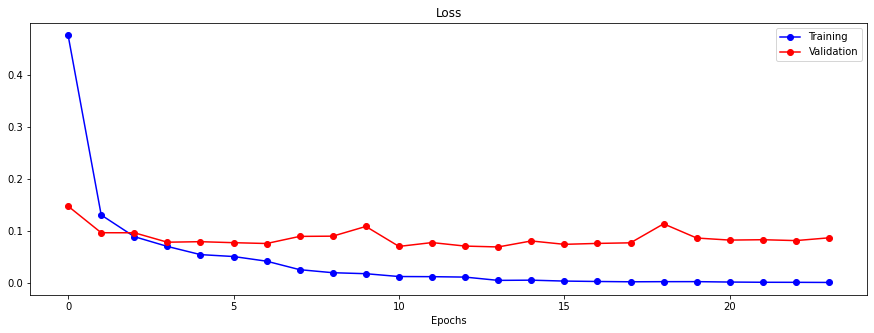

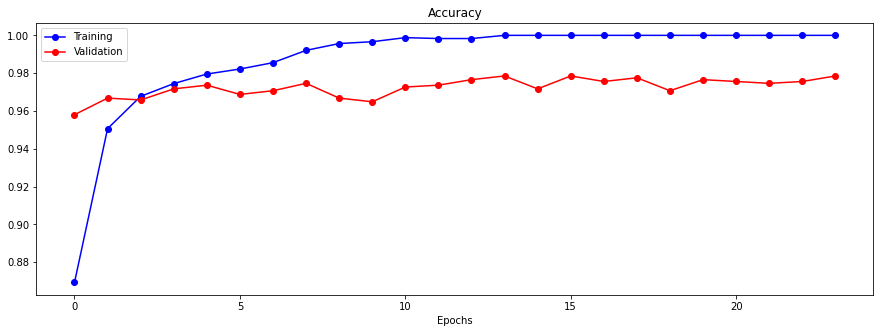

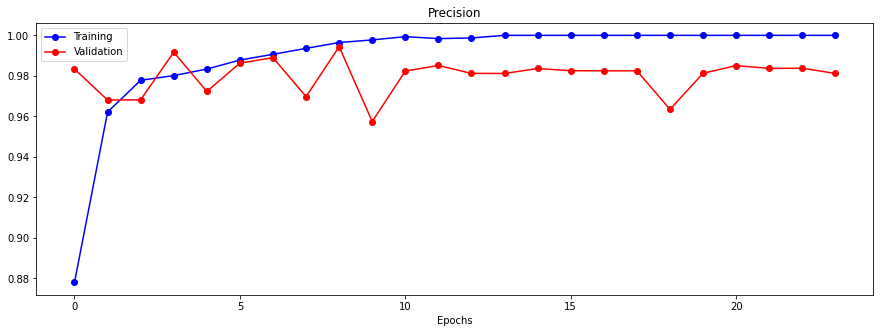

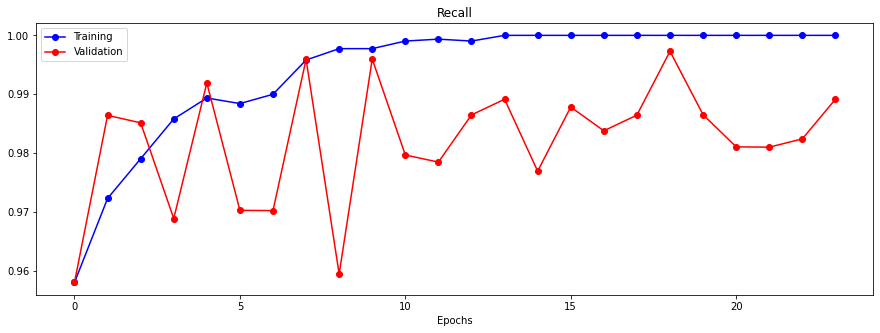

In [50]:
visualize_training_results(results_1)

The plots of Loss, Accuracy, and Precision displayed nice converging lines. At first look, Recall might look a bit unstable, but then if we pay attention to the y-axis of the Recall plot, we'll see that it was fluctuating within a smaller range than Accuracy and Precision ([0.96, 1.0] compared to [0.88, 1.0] and [0.88,1.0] repectively). The gap between training & validation performance on all 3 metrics is around 2%, which is not bad at all. 

Using Accuracy and Recall as the priority, the sweet spots seem to be epoch 13.

Overall, these metric outputs are very high for a simple baseline model. 

In [51]:
# GENERATE PREDICTIONS ON TRAINING & VALIDATION DATA

# RECREATE GENERATORS FOR TRAINING & VALIDATION SET WITH shuffle = False
# IN ORDER TO PRESERVE THE ORDER OF THE IMAGES AND THEIR LABELS

train_eval_generator = ImageDataGenerator(rescale=1.0/255).flow_from_dataframe(
    dataframe=train_df, x_col='image', y_col='label',
    class_mode='raw',
    color_mode='grayscale',
    target_size=(180,180), batch_size=BATCH_SIZE,
    seed=2021,
    shuffle=False     # not shuffle so that the predicts come out in the same order as in the original dataset
)

val_eval_generator = ImageDataGenerator(rescale=1.0/255).flow_from_dataframe(
    dataframe=val_df, x_col='image', y_col='label',
    class_mode='raw',
    color_mode='grayscale',
    target_size=(180,180), batch_size=BATCH_SIZE,
    seed=2021,
    shuffle=False
)

# MAKE PREDICTIONS USING THE EVALUATION GENERATORS
preds_train_1 = baseline.predict(train_eval_generator, 
                                   steps=(train_generator.n//BATCH_SIZE+1), 
                                   verbose=1,
                                   workers=8)
preds_val_1 = baseline.predict(val_eval_generator, 
                                 steps=(val_generator.n//BATCH_SIZE+1),
                                 verbose=1,
                                 workers=8)

Found 4185 validated image filenames.
Found 1047 validated image filenames.
33/33 [==============================] - 7s 146ms/step


In [52]:
baseline_metrics = baseline.evaluate(val_eval_generator)
baseline_metrics

33/33 [==============================] - 9s 268ms/step - loss: 0.0713 - accuracy: 0.9780 - recall: 0.9881 - precision: 0.9816


[0.07130420207977295,
 0.9780324697494507,
 0.9881109595298767,
 0.9816272854804993]

In [64]:
# CREATE A DATAFRAME TO KEEP TRACK OF ALL MODELS PERFOMANCE ON VALIDATION SET
perf_df = pd.DataFrame(columns=['model', 'loss', 'accuracy', 'recall', 'precision'])

In [68]:
# APPEND BASELINE NUMBERS TO DATAFRAME
perf_df.loc[len(perf_df.index)] = ['baseline'] + baseline_metrics

In [69]:
perf_df

,model,loss,accuracy,recall,precision
0,baseline,0.071304,0.978032,0.988111,0.981627


In [42]:
def plot_confusionmatrix(y_true, y_pred):
    cm = confusion_matrix(y_true, y_pred)
    
    ax= plt.subplot()
    # annot=True to annotate cells, ftm='g' to disable scientific notation
    sns.heatmap(cm, annot=True, fmt='g', ax=ax)

    # labels, title and ticks
    ax.set_xlabel('Predicted labels')
    ax.set_ylabel('True labels')
    ax.set_title('Confusion Matrix')
    ax.xaxis.set_ticklabels(['NORMAL', 'PNEUMONIA'])
    ax.yaxis.set_ticklabels(['NORMAL', 'PNEUMONIA'])
    plt.show();

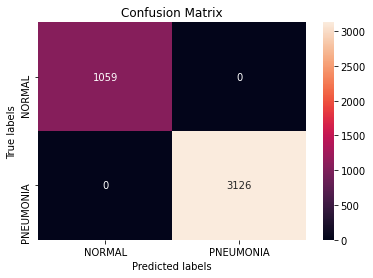

In [71]:
# PLOT CONFUSION MATRIX FOR TRAINING SET
# (converting predicted values from float to nearest integer)
plot_confusionmatrix(train_df['label'], np.rint(preds_train_1))  

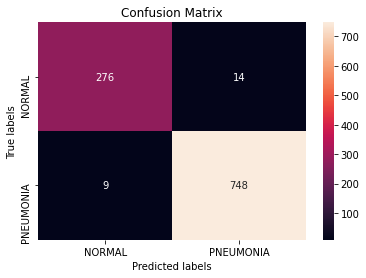

In [72]:
# PLOT CONFUSION MATRIX FOR VALIDATION SET
plot_confusionmatrix(val_df['label'], np.rint(preds_val_1))

In [73]:
val_df.label.value_counts()

1    757
0    290
Name: label, dtype: int64

In [74]:
748/757

0.988110964332893

Using `np.int()` on the probability predictions is the equivalent of using a decision threshold of 0.5. This is something that we could tune later.

Overall the model perform relatively well on unseen data (validation set). Out of 757 Pneumonia cases, it accurately identified 748, and gave us a Recall score of 98.81%, which is very high.

Since Accuracy for a highly imbalanced dataset could be skewed, models with higher Recall score would be prioritized in this business case.

In [75]:
# SAVE THE MODEL
baseline.save("baseline.h5")

In [44]:
import warnings
warnings.filterwarnings('ignore')

In [77]:
# APPEND PREDICTIONS OF THE BASELINE MODEL TO val_df FOR COMPARISON WITH
# OTHER MODELS LATER
val_df['baseline_pred'] = preds_val_1

# FALSE NEGATIVES BY BASELINE MODEL
# USING PROBABILITY THRESHOLD OF 0.5
fn = val_df[(val_df.label - np.rint(val_df.baseline_pred)) == 1]
fn

,image,label,type,baseline_pred
1420,../input/chest-xray-pneumonia/chest_xray/train...,1,virus,0.369866
2337,../input/chest-xray-pneumonia/chest_xray/train...,1,bacteria,0.178071
4624,../input/chest-xray-pneumonia/chest_xray/train...,1,virus,0.098634
4449,../input/chest-xray-pneumonia/chest_xray/train...,1,virus,0.093277
1658,../input/chest-xray-pneumonia/chest_xray/train...,1,virus,0.017062
5190,../input/chest-xray-pneumonia/chest_xray/train...,1,virus,0.002578
4906,../input/chest-xray-pneumonia/chest_xray/train...,1,bacteria,0.206189
4529,../input/chest-xray-pneumonia/chest_xray/train...,1,virus,0.389061
1839,../input/chest-xray-pneumonia/chest_xray/train...,1,bacteria,0.157971


Looking at the False Negatives Dataframe above, I wonder if dropping the probability threshold would help identify Pneumonia cases overall. The highest probability among all the False Negatives is still 0.389, and even if I drop the threshold to 0.3 it'd only improve by 2 points.

In [78]:
fn_generator = ImageDataGenerator(rescale=1.0/255).flow_from_dataframe(
    dataframe=fn, x_col='image', y_col='baseline_pred',
    class_mode='raw',
    color_mode='grayscale',
    target_size=(180,180), batch_size=BATCH_SIZE,
    shuffle=False
)

fn_images, fn_prob = next(fn_generator)

Found 9 validated image filenames.


False Negative Cases by Baseline Model using Probability Threshold = 0.5



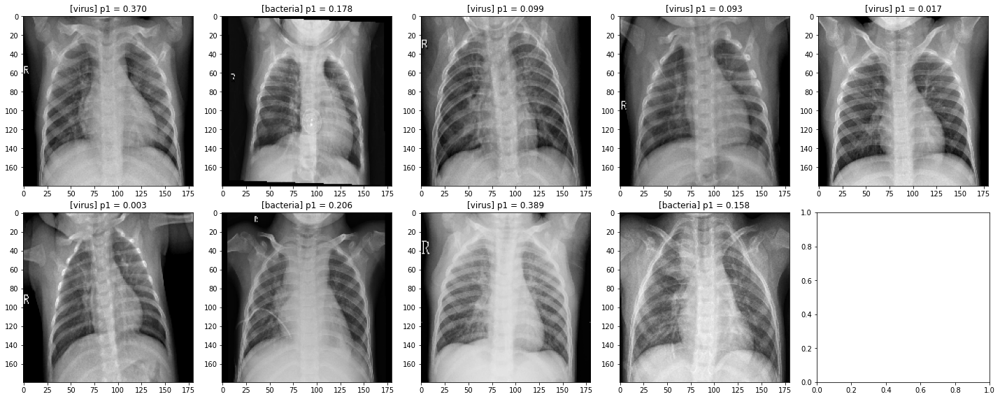

In [81]:
print('False Negative Cases by Baseline Model using Probability Threshold = 0.5')
print()
fig, axes = plt.subplots(nrows=2, ncols=5, figsize=(20,8))

for i in range(len(fn)):
    ax = axes[i // 5][i % 5]
    ax.imshow(fn_images[i], cmap='gray')
    ax.set_title('[{}] p1 = {:.3f}'.format(fn.iloc[i].type, fn_prob[i]))

plt.tight_layout()
plt.show();

In [82]:
fn.type.value_counts()

virus       6
bacteria    3
Name: type, dtype: int64

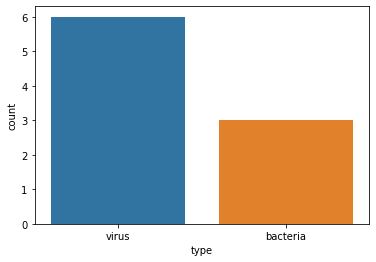

In [83]:
sns.countplot(x='type', data=fn);

Overall, there seems to be more virus cases that were misclassified than bacteria. This is very likely due to the less amount of virus cases in the dataset compared to bacteria.

### Model #2 - More Conv & MaxPooling layers

Next, I am going to construct another Convolutional Neural Networks (CNN) model with a few more Convolutional & MaxPooling layers to see if they migh help increase model performance further:
- 1 Layer of Convolution 2D with padding
- 1 Layer of MaxPooling 2D
- 1 Layer of Convolution 2D with padding
- 1 Layer of MaxPooling 2D
- 1 Hidden Layer of Dense NN

(This architecture have been selected arbitrarily for the most part, and will be adjusted later depending on the outcome).

In [84]:
cnn_2 = Sequential()
cnn_2.add(Conv2D(32, (3,3), activation='relu', padding='same',
               input_shape=[180,180,1]))
cnn_2.add(Conv2D(64, (3,3), activation='relu', padding='same'))
cnn_2.add(MaxPooling2D(pool_size=(2,2)))
cnn_2.add(Conv2D(128, (3,3), activation='relu', padding='same'))
cnn_2.add(MaxPooling2D(pool_size=(2,2)))
cnn_2.add(Flatten())
cnn_2.add(Dense(32, activation='relu'))
cnn_2.add(Dense(1, activation='sigmoid'))

In [85]:
cnn_2.compile(loss='binary_crossentropy',
              optimizer='adam',
              metrics=['accuracy', recall, precision])

cnn_2.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_1 (Conv2D)            (None, 180, 180, 32)      320       
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 180, 180, 64)      18496     
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 90, 90, 64)        0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 90, 90, 128)       73856     
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 45, 45, 128)       0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 259200)            0         
_________________________________________________________________
dense_2 (Dense)              (None, 32)               

In [86]:
checkpoint_cb = ModelCheckpoint('cnn_2.h5',
                                save_best_only=True)
early_stopping_cb = EarlyStopping(patience=10,
                                  restore_best_weights=True)

BATCH_SIZE = 32
EPOCHS = 30

results_2 = cnn_2.fit(train_generator, 
                      validation_data=val_generator,
                      epochs=EPOCHS,
                      steps_per_epoch=(train_generator.n//BATCH_SIZE),
                      validation_steps=(val_generator.n//BATCH_SIZE),
                      callbacks=[checkpoint_cb, early_stopping_cb],
                      use_multiprocessing=True,
                      workers=8)

Epoch 1/30
130/130 [==============================] - 61s 431ms/step - loss: 0.3882 - accuracy: 0.8368 - recall: 0.9702 - precision: 0.9070 - val_loss: 0.1609 - val_accuracy: 0.9551 - val_recall: 0.9596 - val_precision: 0.9780
Epoch 2/30
130/130 [==============================] - 55s 410ms/step - loss: 0.1057 - accuracy: 0.9600 - recall: 0.9739 - precision: 0.9730 - val_loss: 0.1349 - val_accuracy: 0.9512 - val_recall: 0.9419 - val_precision: 0.9901
Epoch 3/30
130/130 [==============================] - 55s 406ms/step - loss: 0.0672 - accuracy: 0.9759 - recall: 0.9821 - precision: 0.9857 - val_loss: 0.0874 - val_accuracy: 0.9775 - val_recall: 0.9824 - val_precision: 0.9864
Epoch 4/30
130/130 [==============================] - 55s 406ms/step - loss: 0.0395 - accuracy: 0.9870 - recall: 0.9922 - precision: 0.9905 - val_loss: 0.1137 - val_accuracy: 0.9678 - val_recall: 0.9756 - val_precision: 0.9796
Epoch 5/30
130/130 [==============================] - 55s 409ms/step - loss: 0.0343 - accura

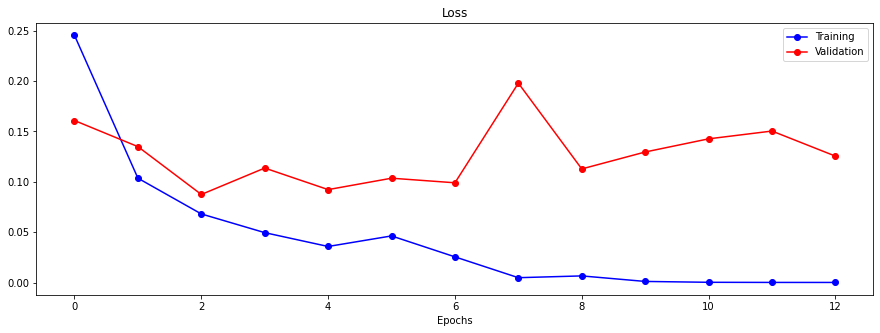

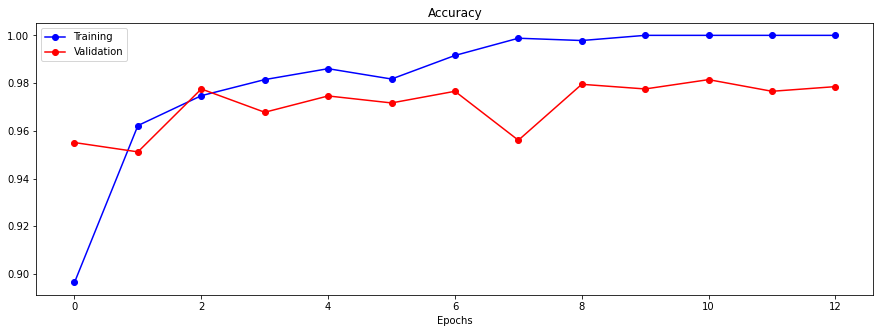

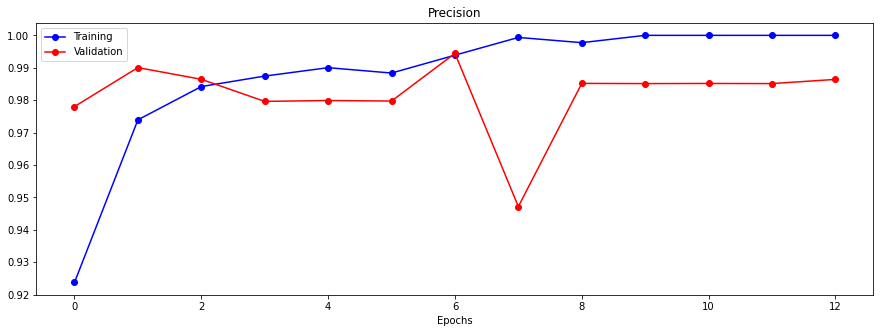

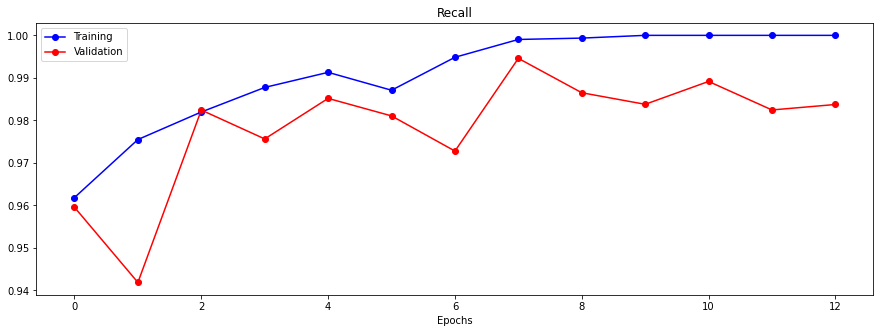

In [87]:
visualize_training_results(results_2)

Somehow the more complicated model did not look as stable as the baseline model.

With such class imbalance in the training dataset, the model would have the tendency to predict more of the abundant class (which is 1-PNEUMONIA), and thus our Recall scores are relatively high. From the business stand point, a model trained on imbalanced data like this is not entirely bad, because it would reduce the risk of mis-classifying PNEUMONIA cases as NORMAL. Although that could cause some inconveniencies to the patients, it would helps ensure higher chance of catching the disease on time. 

The class imbalance of this datase has suggested that these X-ray might have been acquired after consultation with doctors. Naturally in the real world population we would have more NORMAL cases than PNEUMONIA. Therefore depending on where our model would be implemented in the diagnose process, we would need to prioritize different metrics:

- If the model is going to be used to identify potential Pneumonia cases BEFORE a doctor comes in, then we should prioritize Recall in order to minimize the number of False Negatives. 

- On the other hand, if the model is going to be used as a second round of diagnosis AFTER a doctor has looked at the X-ray, Accuracy might be enough.

In [88]:
# MAKE PREDICTIONS USING THE EVALUATION GENERATORS
preds_train_2 = cnn_2.predict(train_eval_generator, 
                                steps=(train_generator.n//BATCH_SIZE+1), 
                                verbose=1,
                                workers=8)
preds_val_2 = cnn_2.predict(val_eval_generator, 
                              steps=(val_generator.n//BATCH_SIZE+1),
                              verbose=1,
                              workers=8)

33/33 [==============================] - 13s 333ms/step


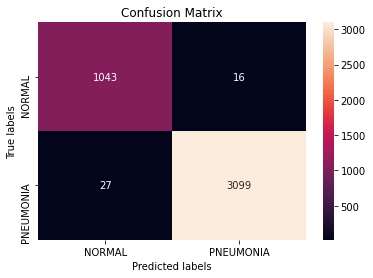

In [89]:
# PLOT CONFUSION MATRIX FOR TRAINING SET
# (converting predicted values from float to nearest integer)
plot_confusionmatrix(train_df['label'], np.rint(preds_train_2))  

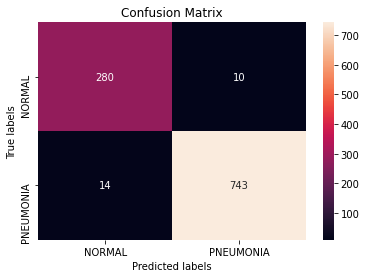

In [90]:
# PLOT CONFUSION MATRIX FOR VALIDATION SET
plot_confusionmatrix(val_df['label'], np.rint(preds_val_2))

In [91]:
cnn_2_metrics = cnn_2.evaluate(val_eval_generator)

33/33 [==============================] - 12s 363ms/step - loss: 0.0890 - accuracy: 0.9761 - recall: 0.9815 - precision: 0.9854


In [92]:
# APPEND BASELINE NUMBERS TO DATAFRAME
perf_df.loc[len(perf_df.index)] = ['cnn_2'] + cnn_2_metrics

In [93]:
perf_df

,model,loss,accuracy,recall,precision
0,baseline,0.071304,0.978032,0.988111,0.981627
1,cnn_2,0.089041,0.976122,0.981506,0.985411


Number of PNEUMONIA cases in the validation set being misclassified as NORMAL went up with this model (from 9 in the previous model to 14). Next I am going to append the predictions by model `cnn_2` to the validation dataframe `val_df` to see if there're any images that have been misclassified by both models.

In [94]:
# APPEND PREDICTIONS OF THE cnn_2 MODEL TO val_df FOR COMPARISON WITH
# OTHER MODELS LATER
val_df['cnn_2_pred'] = preds_val_2
val_df.head()

,image,label,type,baseline_pred,cnn_2_pred
240,../input/chest-xray-pneumonia/chest_xray/train...,0,normal,0.000323,0.016438
584,../input/chest-xray-pneumonia/chest_xray/train...,0,normal,0.001018,0.017792
2259,../input/chest-xray-pneumonia/chest_xray/train...,1,bacteria,0.999959,0.998083
1420,../input/chest-xray-pneumonia/chest_xray/train...,1,virus,0.369866,0.313631
1835,../input/chest-xray-pneumonia/chest_xray/train...,1,virus,0.999983,0.999974


In [95]:
# FALSE NEGATIVES BY cnn_2
fn2 = val_df[(val_df.label - np.rint(val_df.cnn_2_pred)) == 1]
fn2

,image,label,type,baseline_pred,cnn_2_pred
1420,../input/chest-xray-pneumonia/chest_xray/train...,1,virus,0.369866,0.313631
3712,../input/chest-xray-pneumonia/chest_xray/train...,1,virus,0.906012,0.430038
1612,../input/chest-xray-pneumonia/chest_xray/train...,1,virus,0.595459,0.275353
2337,../input/chest-xray-pneumonia/chest_xray/train...,1,bacteria,0.178071,0.131518
3165,../input/chest-xray-pneumonia/chest_xray/train...,1,bacteria,0.505009,0.453172
4624,../input/chest-xray-pneumonia/chest_xray/train...,1,virus,0.098634,0.412647
4449,../input/chest-xray-pneumonia/chest_xray/train...,1,virus,0.093277,0.258000
1658,../input/chest-xray-pneumonia/chest_xray/train...,1,virus,0.017062,0.313802
5190,../input/chest-xray-pneumonia/chest_xray/train...,1,virus,0.002578,0.056724
4299,../input/chest-xray-pneumonia/chest_xray/train...,1,virus,0.899709,0.331328


In [96]:
# PNEUMONIA CASES THAT HAVE BEEN INCORRECTLY PREDICTED BY baseline
fn1 = val_df[(val_df.label - np.rint(val_df.baseline_pred)) == 1]
fn1

,image,label,type,baseline_pred,cnn_2_pred
1420,../input/chest-xray-pneumonia/chest_xray/train...,1,virus,0.369866,0.313631
2337,../input/chest-xray-pneumonia/chest_xray/train...,1,bacteria,0.178071,0.131518
4624,../input/chest-xray-pneumonia/chest_xray/train...,1,virus,0.098634,0.412647
4449,../input/chest-xray-pneumonia/chest_xray/train...,1,virus,0.093277,0.258000
1658,../input/chest-xray-pneumonia/chest_xray/train...,1,virus,0.017062,0.313802
5190,../input/chest-xray-pneumonia/chest_xray/train...,1,virus,0.002578,0.056724
4906,../input/chest-xray-pneumonia/chest_xray/train...,1,bacteria,0.206189,0.104631
4529,../input/chest-xray-pneumonia/chest_xray/train...,1,virus,0.389061,0.229874
1839,../input/chest-xray-pneumonia/chest_xray/train...,1,bacteria,0.157971,0.616528


In [97]:
len(set(fn2.index) - set(fn1.index))

6

In [98]:
len(set(fn1.index) - set(fn2.index))

1

`cnn_2` misclassified 8 out of the 9 false negative cases as `baseline`, plus 6 additional Pneumonia cases that were accurately identified by `baseline`.

`cnn_2` only accurately classified 1 Pneumonia cases that `baseline` missed.

Both models seem to have struggled with virus cases.

In [99]:
# PNEUMONIA CASES THAT HAVE BEEN INCORRECTLY PREDICTED BY BOTH MODELS
fn_both = val_df[((val_df.label - np.rint(val_df.baseline_pred)) == 1) & \
                 (np.rint(val_df.baseline_pred) == np.rint(val_df.cnn_2_pred))]
fn_both

,image,label,type,baseline_pred,cnn_2_pred
1420,../input/chest-xray-pneumonia/chest_xray/train...,1,virus,0.369866,0.313631
2337,../input/chest-xray-pneumonia/chest_xray/train...,1,bacteria,0.178071,0.131518
4624,../input/chest-xray-pneumonia/chest_xray/train...,1,virus,0.098634,0.412647
4449,../input/chest-xray-pneumonia/chest_xray/train...,1,virus,0.093277,0.258000
1658,../input/chest-xray-pneumonia/chest_xray/train...,1,virus,0.017062,0.313802
5190,../input/chest-xray-pneumonia/chest_xray/train...,1,virus,0.002578,0.056724
4906,../input/chest-xray-pneumonia/chest_xray/train...,1,bacteria,0.206189,0.104631
4529,../input/chest-xray-pneumonia/chest_xray/train...,1,virus,0.389061,0.229874


In [100]:
fn1.describe()

,label,baseline_pred,cnn_2_pred
count,9.0,9.000000,9.000000
mean,1.0,0.168079,0.270817
std,0.0,0.137759,0.172486
min,1.0,0.002578,0.056724
25%,1.0,0.093277,0.131518
50%,1.0,0.157971,0.258000
75%,1.0,0.206189,0.313802
max,1.0,0.389061,0.616528


In [101]:
fn_both.describe()

,label,baseline_pred,cnn_2_pred
count,8.0,8.000000,8.000000
mean,1.0,0.169342,0.227603
std,0.0,0.147215,0.121629
min,1.0,0.002578,0.056724
25%,1.0,0.074223,0.124796
50%,1.0,0.138353,0.243937
75%,1.0,0.247108,0.313674
max,1.0,0.389061,0.412647


Between the 2 models, `cnn_2` seems to predict higher probabilities for the 8 challenging PNEUMONIA cases that both failed on. However, the tradeoff is an additional 6 False Negatives.  

In [102]:
# DISPLAYING THE FALSE NEGATIVE CASES
fn_generator = ImageDataGenerator(rescale=1.0/255).flow_from_dataframe(
    dataframe=fn_both, x_col='image', y_col='cnn_2_pred',
    class_mode='raw',
    color_mode='grayscale',
    target_size=(180,180), batch_size=BATCH_SIZE,
    shuffle=False
)

fn_images, fn_prob = next(fn_generator)

Found 8 validated image filenames.


PNEUMONIA cases predicted as NORMAL by both models



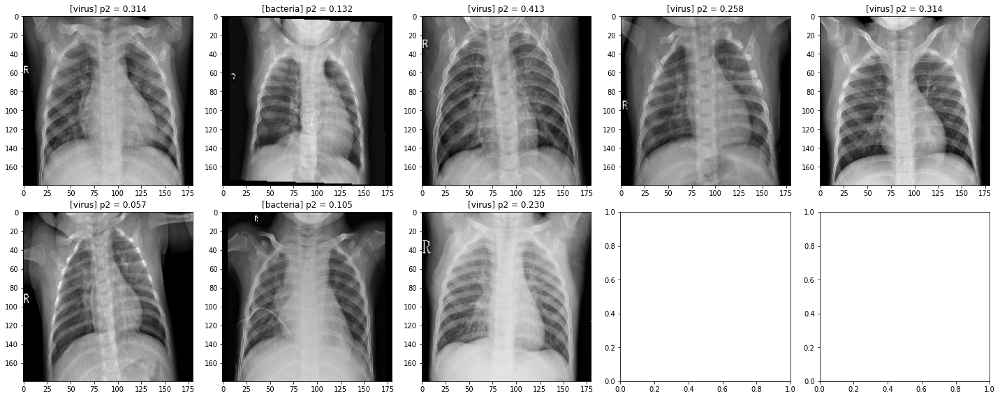

In [104]:
print('PNEUMONIA cases predicted as NORMAL by both models')
print()
fig, axes = plt.subplots(nrows=2, ncols=5, figsize=(20,8))

for i in range(len(fn_both)):
    ax = axes[i // 5][i % 5]
    ax.imshow(fn_images[i], cmap='gray')
    ax.set_title('[{}] p2 = {:.3f}'.format(fn_both.iloc[i].type, fn_prob[i]))

plt.tight_layout()
plt.show();

In [105]:
# SAVE THE MODEL
cnn_2.save("cnn_2.h5")

Since both of these 2 models have been trained on highly imbalance class, they both would have the tendency to output more of the abundant class (1 or PNEUMONIA). Although this would certainly help reduce the number of FALSE NEGATIVES (PNEUMONIA cases that are misclassified as NORMAL by the models), I wonder if these model actually learn to differentiate between the 2 classes or just blindly outputing PNEUMONIA. 

Between the 2 models, I still think the `baseline` is more accurate, because overall it outputs less False Negative cases.

### Model #3 - More Hidden layers

Next, I am going to construct another CNN model with a the same Convolutional & MaxPooling layers as the baseline, plus 1 more hidden Dense layer to see if they migh help increase model performance further:
- 1 Layer of Convolution 2D with padding
- 1 Layer of MaxPooling 2D
- 2 Hidden Dense Layers with more Neurons

(This architecture have been selected arbitrarily for the most part, and will be adjusted later based on outcome).

In [108]:
cnn_3 = Sequential()
cnn_3.add(Conv2D(32, (3,3), activation='relu', padding='same',
               input_shape=[180,180,1]))
cnn_3.add(MaxPooling2D(pool_size=(2,2)))
cnn_3.add(Flatten())
cnn_3.add(Dense(128, activation='relu'))
cnn_3.add(Dense(64, activation='relu'))
cnn_3.add(Dense(1, activation='sigmoid'))

In [109]:
cnn_3.compile(loss='binary_crossentropy',
              optimizer='adam',
              metrics=['accuracy', recall, precision])

cnn_3.summary()

Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_5 (Conv2D)            (None, 180, 180, 32)      320       
_________________________________________________________________
max_pooling2d_4 (MaxPooling2 (None, 90, 90, 32)        0         
_________________________________________________________________
flatten_3 (Flatten)          (None, 259200)            0         
_________________________________________________________________
dense_7 (Dense)              (None, 128)               33177728  
_________________________________________________________________
dense_8 (Dense)              (None, 64)                8256      
_________________________________________________________________
dense_9 (Dense)              (None, 1)                 65        
Total params: 33,186,369
Trainable params: 33,186,369
Non-trainable params: 0
__________________________________________

In [110]:
checkpoint_cb = ModelCheckpoint('cnn_3.h5',
                                save_best_only=True)
early_stopping_cb = EarlyStopping(patience=10,
                                  restore_best_weights=True)

BATCH_SIZE = 32
EPOCHS = 30

results_3 = cnn_3.fit(train_generator, 
                      validation_data=val_generator,
                      epochs=EPOCHS,
                      steps_per_epoch=(train_generator.n//BATCH_SIZE),
                      validation_steps=(val_generator.n//BATCH_SIZE),
                      callbacks=[checkpoint_cb, early_stopping_cb],
                      use_multiprocessing=True,
                      workers=8)

Epoch 1/30
130/130 [==============================] - 39s 277ms/step - loss: 1.2789 - accuracy: 0.8223 - recall: 0.9574 - precision: 0.9038 - val_loss: 0.1116 - val_accuracy: 0.9570 - val_recall: 0.9783 - val_precision: 0.9627
Epoch 2/30
130/130 [==============================] - 38s 277ms/step - loss: 0.1220 - accuracy: 0.9517 - recall: 0.9729 - precision: 0.9622 - val_loss: 0.1163 - val_accuracy: 0.9600 - val_recall: 0.9488 - val_precision: 0.9958
Epoch 3/30
130/130 [==============================] - 38s 274ms/step - loss: 0.0566 - accuracy: 0.9802 - recall: 0.9868 - precision: 0.9865 - val_loss: 0.1282 - val_accuracy: 0.9531 - val_recall: 0.9389 - val_precision: 0.9957
Epoch 4/30
130/130 [==============================] - 38s 277ms/step - loss: 0.0525 - accuracy: 0.9827 - recall: 0.9872 - precision: 0.9897 - val_loss: 0.1157 - val_accuracy: 0.9590 - val_recall: 0.9460 - val_precision: 0.9972
Epoch 5/30
130/130 [==============================] - 37s 274ms/step - loss: 0.0355 - accura

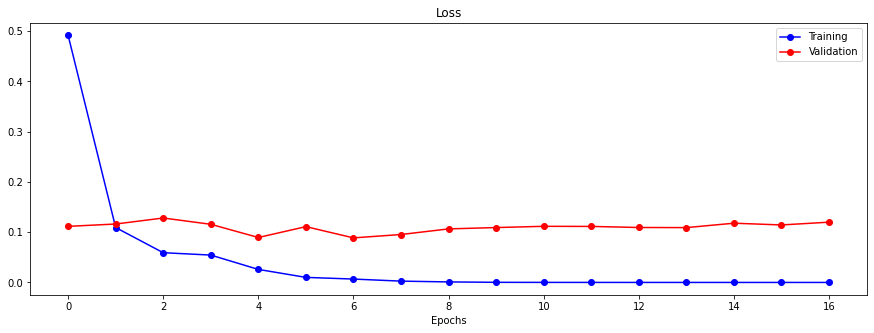

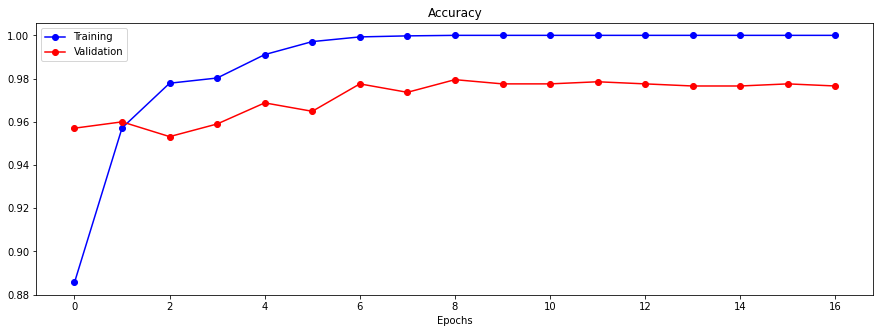

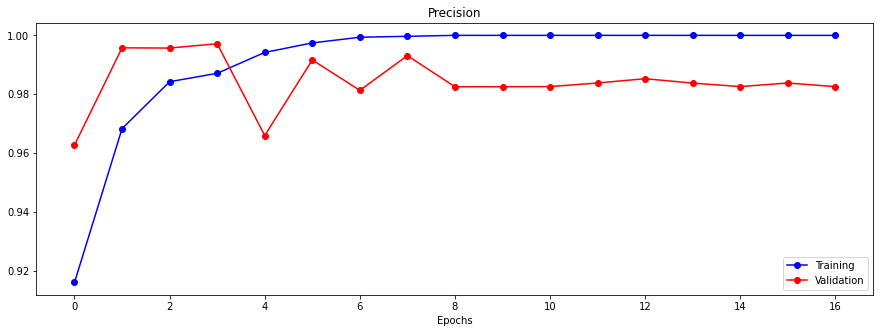

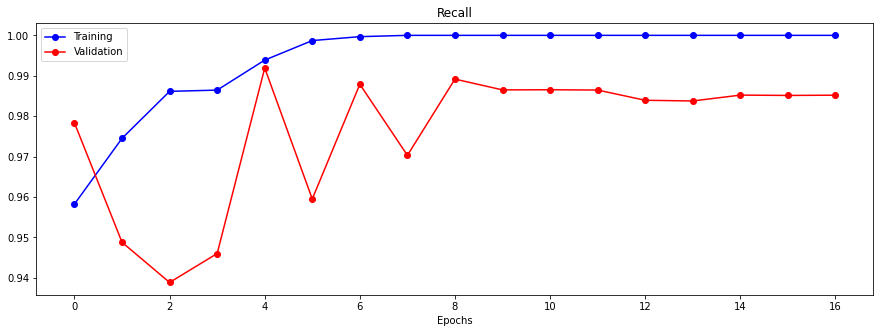

In [111]:
visualize_training_results(results_3)

In [112]:
# MAKE PREDICTIONS USING THE EVALUATION GENERATORS
preds_train_3 = cnn_3.predict(train_eval_generator, 
                                steps=(train_generator.n//BATCH_SIZE+1), 
                                verbose=1,
                                workers=8)
preds_val_3 = cnn_3.predict(val_eval_generator, 
                              steps=(val_generator.n//BATCH_SIZE+1),
                              verbose=1,
                              workers=8)

33/33 [==============================] - 7s 156ms/step


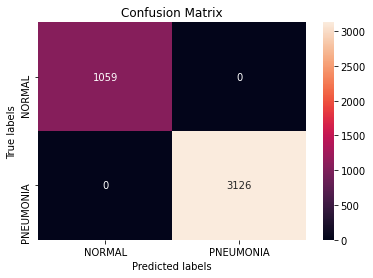

In [113]:
# PLOT CONFUSION MATRIX FOR TRAINING SET
# (converting predicted values from float to nearest integer)
plot_confusionmatrix(train_df['label'], np.rint(preds_train_3))  

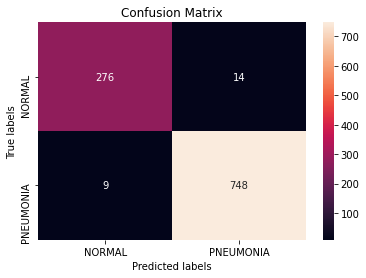

In [114]:
# PLOT CONFUSION MATRIX FOR VALIDATION SET
plot_confusionmatrix(val_df['label'], np.rint(preds_val_3))

In [115]:
cnn_3_metrics = cnn_3.evaluate(val_eval_generator)

33/33 [==============================] - 9s 269ms/step - loss: 0.0869 - accuracy: 0.9780 - recall: 0.9881 - precision: 0.9816


In [116]:
perf_df.loc[len(perf_df.index)] = ['cnn_3'] + cnn_3_metrics
perf_df

,model,loss,accuracy,recall,precision
0,baseline,0.071304,0.978032,0.988111,0.981627
1,cnn_2,0.089041,0.976122,0.981506,0.985411
2,cnn_3,0.086928,0.978032,0.988111,0.981627


The 3 models are VERY similar in performance so far, especially `baseline` and `cnn_3`.

Compared to `cnn_3`, the baseline's loss on the validation set is lower by a very small margin.

In [117]:
# APPEND PREDICTIONS OF THE cnn_3 MODEL TO val_df FOR COMPARISON WITH
# OTHER MODELS LATER
val_df['cnn_3_pred'] = preds_val_3
val_df.head()

,image,label,type,baseline_pred,cnn_2_pred,cnn_3_pred
240,../input/chest-xray-pneumonia/chest_xray/train...,0,normal,0.000323,0.016438,0.000553
584,../input/chest-xray-pneumonia/chest_xray/train...,0,normal,0.001018,0.017792,0.000179
2259,../input/chest-xray-pneumonia/chest_xray/train...,1,bacteria,0.999959,0.998083,0.999969
1420,../input/chest-xray-pneumonia/chest_xray/train...,1,virus,0.369866,0.313631,0.533788
1835,../input/chest-xray-pneumonia/chest_xray/train...,1,virus,0.999983,0.999974,0.999999


In [118]:
# PNEUMONIA CASES THAT HAVE BEEN INCORRECTLY PREDICTED BY cnn_3
fn3 = val_df[(val_df.label - np.rint(val_df.cnn_3_pred)) == 1]
fn3

,image,label,type,baseline_pred,cnn_2_pred,cnn_3_pred
2337,../input/chest-xray-pneumonia/chest_xray/train...,1,bacteria,0.178071,0.131518,0.055254
4624,../input/chest-xray-pneumonia/chest_xray/train...,1,virus,0.098634,0.412647,0.020190
4449,../input/chest-xray-pneumonia/chest_xray/train...,1,virus,0.093277,0.258000,0.032067
1658,../input/chest-xray-pneumonia/chest_xray/train...,1,virus,0.017062,0.313802,0.007826
5190,../input/chest-xray-pneumonia/chest_xray/train...,1,virus,0.002578,0.056724,0.002272
4906,../input/chest-xray-pneumonia/chest_xray/train...,1,bacteria,0.206189,0.104631,0.070067
4529,../input/chest-xray-pneumonia/chest_xray/train...,1,virus,0.389061,0.229874,0.447499
4520,../input/chest-xray-pneumonia/chest_xray/train...,1,virus,0.511022,0.095934,0.078174
1839,../input/chest-xray-pneumonia/chest_xray/train...,1,bacteria,0.157971,0.616528,0.048777


In [119]:
len(set(fn3.index) - set(fn1.index))

1

In [120]:
len(set(fn1.index) - set(fn3.index))

1

So, although both models have 9 cases of False Negatives, model `cnn_3` accurately identified 8 out of 9 False Negative cases by the baseline model, and misclassified an extra one. That explains why they have different loss values.

In [121]:
# SAVE THE MODEL
cnn_3.save("cnn_3.h5")

### Model #4 - Correcting Class Imbalances

For this model, I am going to recycle the architecture of the baseline because it's simpler yet performed just as well as the other models.

The only difference between this model and the original `baseline` is that this one would be fitted on more balanced data (by setting `class_weight` during fitting).

In [45]:
from sklearn.utils import class_weight

In [46]:
class_weights = class_weight.compute_class_weight('balanced',
                                                  classes=train_df['label'].unique(),
                                                  y=train_df['label'])

In [47]:
print(train_df['label'].unique())
print(class_weights)

[0 1]
[1.97592068 0.6693858 ]


In [48]:
class_weight = {0: class_weights[0], 1: class_weights[1]}
class_weight

{0: 1.9759206798866855, 1: 0.6693857965451055}

In [126]:
# RECONSTRUCT baseline WITH THE SAME ARCHITECTURE - CALLED cnn_4
cnn_4 = Sequential()
cnn_4.add(Conv2D(32, (3,3), activation='relu', padding='same',
               input_shape=[180,180,1]))
cnn_4.add(MaxPooling2D(pool_size=(2,2)))
cnn_4.add(Flatten())
cnn_4.add(Dense(32, activation='relu'))
cnn_4.add(Dense(1, activation='sigmoid'))

In [127]:
cnn_4.compile(loss='binary_crossentropy',
              optimizer='adam',
              metrics=['accuracy', recall, precision])

cnn_4.summary()

Model: "sequential_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_6 (Conv2D)            (None, 180, 180, 32)      320       
_________________________________________________________________
max_pooling2d_5 (MaxPooling2 (None, 90, 90, 32)        0         
_________________________________________________________________
flatten_4 (Flatten)          (None, 259200)            0         
_________________________________________________________________
dense_10 (Dense)             (None, 32)                8294432   
_________________________________________________________________
dense_11 (Dense)             (None, 1)                 33        
Total params: 8,294,785
Trainable params: 8,294,785
Non-trainable params: 0
_________________________________________________________________


In [128]:
checkpoint_cb = ModelCheckpoint('cnn_4.h5',
                                save_best_only=True)
early_stopping_cb = EarlyStopping(patience=10,
                                  restore_best_weights=True)

BATCH_SIZE = 32
EPOCHS = 30

results_4 = cnn_4.fit(train_generator, 
                      validation_data=val_generator,
                      epochs=EPOCHS,
                      class_weight=class_weight,
                      steps_per_epoch=(train_generator.n//BATCH_SIZE),
                      validation_steps=(val_generator.n//BATCH_SIZE),
                      callbacks=[checkpoint_cb, early_stopping_cb])

Epoch 1/30
130/130 [==============================] - 47s 353ms/step - loss: 1.0448 - accuracy: 0.7017 - recall: 0.8728 - precision: 0.8984 - val_loss: 0.3346 - val_accuracy: 0.9395 - val_recall: 0.9474 - val_precision: 0.9683
Epoch 2/30
130/130 [==============================] - 46s 354ms/step - loss: 0.4144 - accuracy: 0.9421 - recall: 0.9615 - precision: 0.9607 - val_loss: 0.3402 - val_accuracy: 0.9082 - val_recall: 0.8742 - val_precision: 0.9985
Epoch 3/30
130/130 [==============================] - 45s 349ms/step - loss: 0.3497 - accuracy: 0.9570 - recall: 0.9650 - precision: 0.9780 - val_loss: 0.2181 - val_accuracy: 0.9619 - val_recall: 0.9595 - val_precision: 0.9875
Epoch 4/30
130/130 [==============================] - 46s 354ms/step - loss: 0.3318 - accuracy: 0.9601 - recall: 0.9612 - precision: 0.9843 - val_loss: 0.2050 - val_accuracy: 0.9639 - val_recall: 0.9566 - val_precision: 0.9930
Epoch 5/30
130/130 [==============================] - 46s 351ms/step - loss: 0.2967 - accura

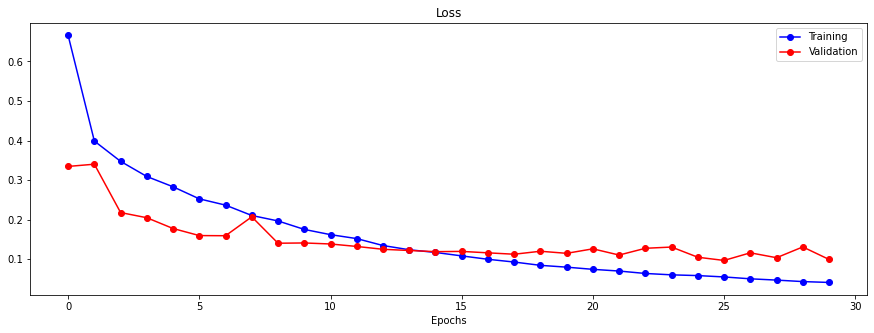

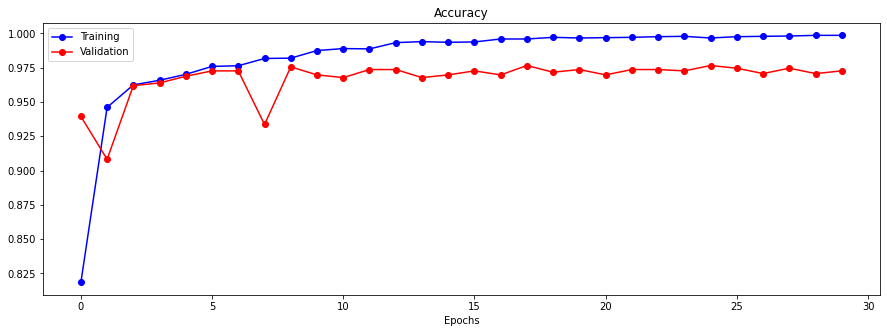

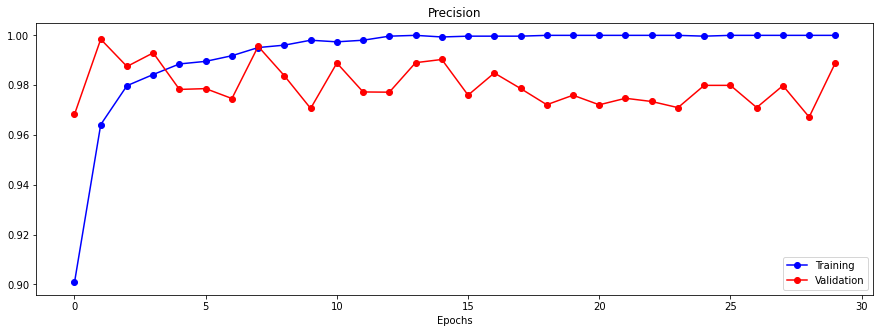

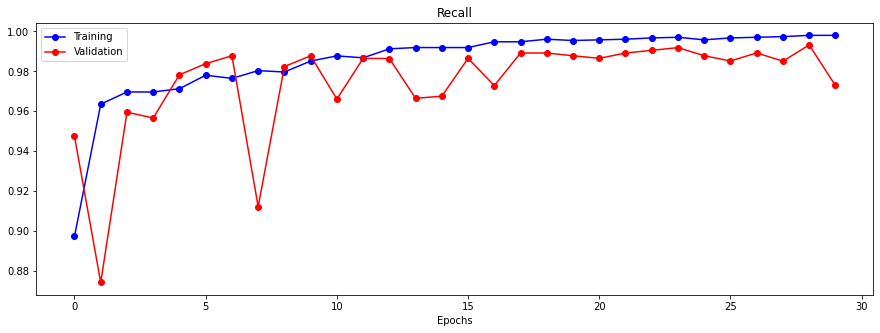

In [129]:
visualize_training_results(results_4)

In [130]:
# MAKE PREDICTIONS USING THE EVALUATION GENERATORS
preds_train_4 = cnn_4.predict(train_eval_generator, 
                           steps=(train_generator.n//BATCH_SIZE+1), 
                           verbose=1,
                           workers=8)
preds_val_4 = cnn_4.predict(val_eval_generator, 
                         steps=(val_generator.n//BATCH_SIZE+1),
                         verbose=1,
                         workers=8)

33/33 [==============================] - 7s 150ms/step


In [131]:
cnn_4_metrics = cnn_4.evaluate(val_eval_generator)

33/33 [==============================] - 9s 270ms/step - loss: 0.0984 - accuracy: 0.9733 - recall: 0.9736 - precision: 0.9893


In [132]:
perf_df.loc[len(perf_df.index)] = ['cnn_4'] + cnn_4_metrics
perf_df

,model,loss,accuracy,recall,precision
0,baseline,0.071304,0.978032,0.988111,0.981627
1,cnn_2,0.089041,0.976122,0.981506,0.985411
2,cnn_3,0.086928,0.978032,0.988111,0.981627
3,cnn_4,0.098447,0.973257,0.973580,0.989262


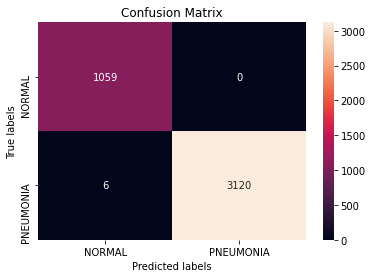

In [133]:
# PLOT CONFUSION MATRIX FOR TRAINING SET
# (converting predicted values from float to nearest integer)
plot_confusionmatrix(train_df['label'], np.rint(preds_train_4)) 

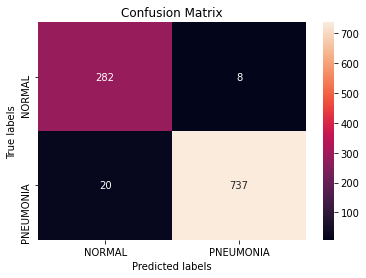

In [134]:
# PLOT CONFUSION MATRIX FOR VALIDATION SET
plot_confusionmatrix(val_df['label'], np.rint(preds_val_4))

Model 4 `cnn_4` has 11 more False Negatives than `baseline` did, and this is mostly due to it being trained on more balanced data, and it's less likely to output PNEUMONIA than the other model. Next, I want to look at whether these 20 false negative cases share anything in common with the other models' false negatives. 

In [135]:
# APPEND PREDICTIONS OF THE cnn_2 MODEL TO val_df FOR COMPARISON WITH
# OTHER MODELS LATER
val_df['cnn_4_pred'] = preds_val_4
val_df.head()

,image,label,type,baseline_pred,cnn_2_pred,cnn_3_pred,cnn_4_pred
240,../input/chest-xray-pneumonia/chest_xray/train...,0,normal,0.000323,0.016438,0.000553,0.071391
584,../input/chest-xray-pneumonia/chest_xray/train...,0,normal,0.001018,0.017792,0.000179,0.071391
2259,../input/chest-xray-pneumonia/chest_xray/train...,1,bacteria,0.999959,0.998083,0.999969,0.999994
1420,../input/chest-xray-pneumonia/chest_xray/train...,1,virus,0.369866,0.313631,0.533788,0.071391
1835,../input/chest-xray-pneumonia/chest_xray/train...,1,virus,0.999983,0.999974,0.999999,0.999998


In [136]:
# PNEUMONIA CASES THAT HAVE BEEN INCORRECTLY PREDICTED BY cnn_4
fn4 = val_df[(val_df.label - np.rint(val_df.cnn_4_pred)) == 1]
fn4

,image,label,type,baseline_pred,cnn_2_pred,cnn_3_pred,cnn_4_pred
1420,../input/chest-xray-pneumonia/chest_xray/train...,1,virus,0.369866,0.313631,0.533788,0.071391
3712,../input/chest-xray-pneumonia/chest_xray/train...,1,virus,0.906012,0.430038,0.938742,0.474129
4343,../input/chest-xray-pneumonia/chest_xray/train...,1,bacteria,0.563221,0.912859,0.941181,0.071391
4118,../input/chest-xray-pneumonia/chest_xray/train...,1,virus,0.637929,0.739685,0.958825,0.197294
1612,../input/chest-xray-pneumonia/chest_xray/train...,1,virus,0.595459,0.275353,0.853194,0.376265
2337,../input/chest-xray-pneumonia/chest_xray/train...,1,bacteria,0.178071,0.131518,0.055254,0.071391
3165,../input/chest-xray-pneumonia/chest_xray/train...,1,bacteria,0.505009,0.453172,0.675485,0.071391
4624,../input/chest-xray-pneumonia/chest_xray/train...,1,virus,0.098634,0.412647,0.020190,0.071391
4449,../input/chest-xray-pneumonia/chest_xray/train...,1,virus,0.093277,0.258000,0.032067,0.071391
1658,../input/chest-xray-pneumonia/chest_xray/train...,1,virus,0.017062,0.313802,0.007826,0.071391


In [137]:
# PNEUMONIA CASES THAT HAVE BEEN INCORRECTLY PREDICTED BY 3 MODELS baseline, cnn_3 and cnn_4
fn_all = val_df[((val_df.label - np.rint(val_df.baseline_pred)) == 1) & \
                (np.rint(val_df.baseline_pred) == np.rint(val_df.cnn_3_pred)) & \
                (np.rint(val_df.baseline_pred) == np.rint(val_df.cnn_4_pred))]
fn_all

,image,label,type,baseline_pred,cnn_2_pred,cnn_3_pred,cnn_4_pred
2337,../input/chest-xray-pneumonia/chest_xray/train...,1,bacteria,0.178071,0.131518,0.055254,0.071391
4624,../input/chest-xray-pneumonia/chest_xray/train...,1,virus,0.098634,0.412647,0.020190,0.071391
4449,../input/chest-xray-pneumonia/chest_xray/train...,1,virus,0.093277,0.258000,0.032067,0.071391
1658,../input/chest-xray-pneumonia/chest_xray/train...,1,virus,0.017062,0.313802,0.007826,0.071391
5190,../input/chest-xray-pneumonia/chest_xray/train...,1,virus,0.002578,0.056724,0.002272,0.071391
4906,../input/chest-xray-pneumonia/chest_xray/train...,1,bacteria,0.206189,0.104631,0.070067,0.071391
4529,../input/chest-xray-pneumonia/chest_xray/train...,1,virus,0.389061,0.229874,0.447499,0.071391
1839,../input/chest-xray-pneumonia/chest_xray/train...,1,bacteria,0.157971,0.616528,0.048777,0.071391


These are the same 8 Pneumonia X-rays that both `baseline` and `cnn_3` failed to identified.

In [138]:
fn_generator = ImageDataGenerator(rescale=1.0/255).flow_from_dataframe(
    dataframe=fn_all, x_col='image', y_col='cnn_4_pred',
    class_mode='raw',
    color_mode='grayscale',
    target_size=(180,180), batch_size=BATCH_SIZE,
    shuffle=False
)

fn_images, fn_prob = next(fn_generator)

Found 8 validated image filenames.


PNEUMONIA cases predicted as NORMAL by 3 models baseline, cnn_3 and cnn_4



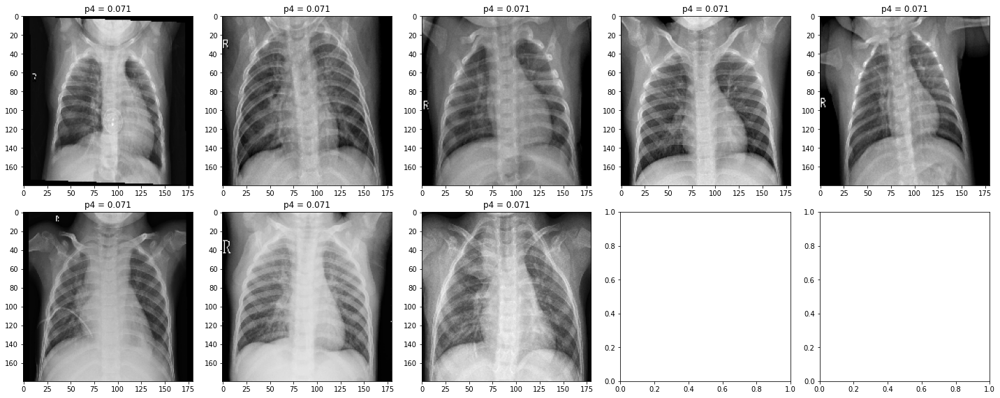

In [139]:
print('PNEUMONIA cases predicted as NORMAL by 3 models baseline, cnn_3 and cnn_4')
print()
fig, axes = plt.subplots(nrows=2, ncols=5, figsize=(20,8))

for i in range(len(fn_all)):
    ax = axes[i // 5][i % 5]
    ax.imshow(fn_images[i], cmap='gray')
    ax.set_title('p4 = {:.3f}'.format(fn_prob[i]))

plt.tight_layout()
plt.show();

In [140]:
# SAVE THE MODEL
cnn_4.save("cnn_4.h5")

### Model #5 - Dropout

Next, I am going to construct a model with basically the same architecture as `cnn_3` with the exception of 2 extra Dropout layers (using rate = 0.3) to hopefully reduce overfitting (although the performance gaps between training and validation in all 4 models so far have been quite small) while still learning important information by having more layers.

In [142]:
# RECONSTRUCT cnn_4 WITH THE SAME ARCHITECTURE - called cnn_5
# ADDING 2 DROPOUT LAYERS
cnn_5 = Sequential()
cnn_5.add(Conv2D(32, (3,3), activation='relu', padding='same',
               input_shape=[180,180,1]))
cnn_5.add(MaxPooling2D(pool_size=(2,2)))
cnn_5.add(Flatten())
cnn_5.add(Dense(64, activation='relu'))
cnn_5.add(Dropout(0.3))
cnn_5.add(Dense(32, activation='relu'))
cnn_5.add(Dropout(0.3))
cnn_5.add(Dense(1, activation='sigmoid'))

In [143]:
cnn_5.compile(loss='binary_crossentropy',
              optimizer='adam',
              metrics=['accuracy', recall, precision])

cnn_5.summary()

Model: "sequential_5"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_7 (Conv2D)            (None, 180, 180, 32)      320       
_________________________________________________________________
max_pooling2d_6 (MaxPooling2 (None, 90, 90, 32)        0         
_________________________________________________________________
flatten_5 (Flatten)          (None, 259200)            0         
_________________________________________________________________
dense_12 (Dense)             (None, 64)                16588864  
_________________________________________________________________
dropout (Dropout)            (None, 64)                0         
_________________________________________________________________
dense_13 (Dense)             (None, 32)                2080      
_________________________________________________________________
dropout_1 (Dropout)          (None, 32)               

In [144]:
checkpoint_cb = ModelCheckpoint('cnn_5.h5',
                                save_best_only=True)
early_stopping_cb = EarlyStopping(patience=10,
                                  restore_best_weights=True)

BATCH_SIZE = 32
EPOCHS = 50

results_5 = cnn_5.fit(train_generator, 
                      validation_data=val_generator,
                      epochs=EPOCHS,
                      class_weight=class_weight,
                      steps_per_epoch=(train_generator.n//BATCH_SIZE),
                      validation_steps=(val_generator.n//BATCH_SIZE),
                      callbacks=[checkpoint_cb, early_stopping_cb])

Epoch 1/50
130/130 [==============================] - 47s 356ms/step - loss: 1.4455 - accuracy: 0.5809 - recall: 0.7313 - precision: 0.8943 - val_loss: 0.4388 - val_accuracy: 0.8623 - val_recall: 0.8127 - val_precision: 0.9967
Epoch 2/50
130/130 [==============================] - 46s 356ms/step - loss: 0.3179 - accuracy: 0.8699 - recall: 0.8653 - precision: 0.9585 - val_loss: 0.1368 - val_accuracy: 0.9639 - val_recall: 0.9610 - val_precision: 0.9889
Epoch 3/50
130/130 [==============================] - 45s 350ms/step - loss: 0.1933 - accuracy: 0.9526 - recall: 0.9561 - precision: 0.9793 - val_loss: 0.1309 - val_accuracy: 0.9629 - val_recall: 0.9553 - val_precision: 0.9930
Epoch 4/50
130/130 [==============================] - 45s 350ms/step - loss: 0.1560 - accuracy: 0.9650 - recall: 0.9710 - precision: 0.9818 - val_loss: 0.0850 - val_accuracy: 0.9727 - val_recall: 0.9798 - val_precision: 0.9824
Epoch 5/50
130/130 [==============================] - 46s 353ms/step - loss: 0.1266 - accura

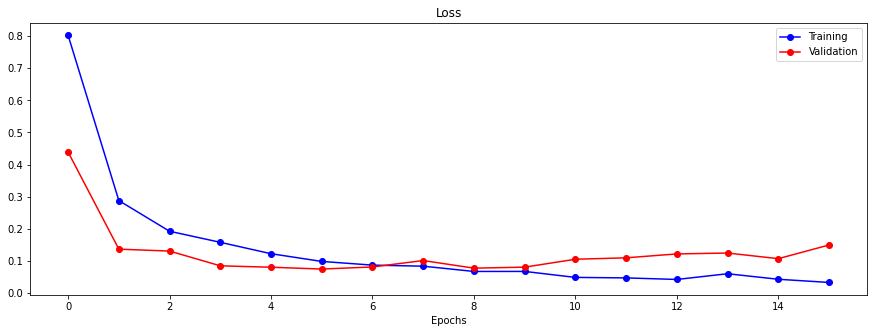

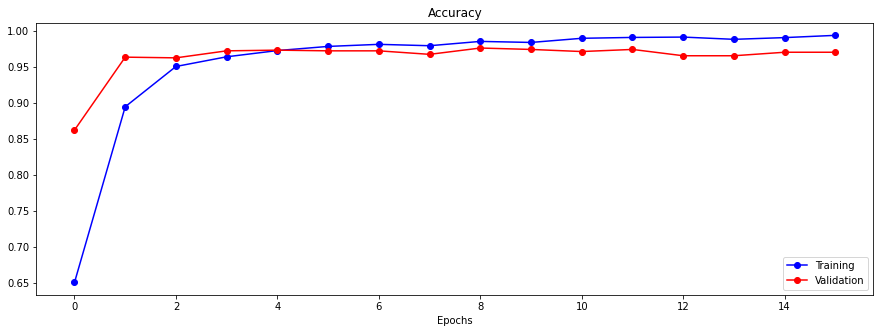

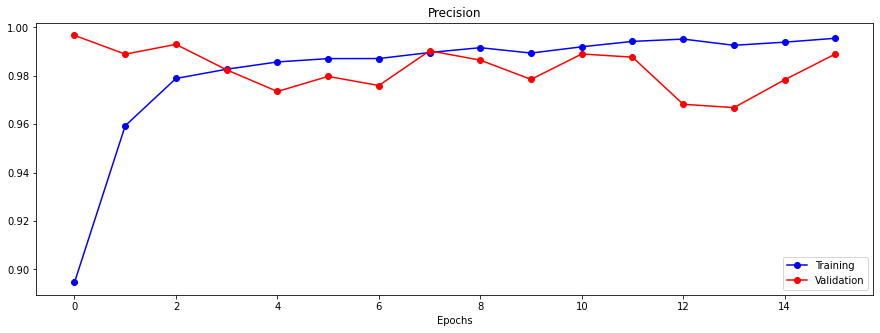

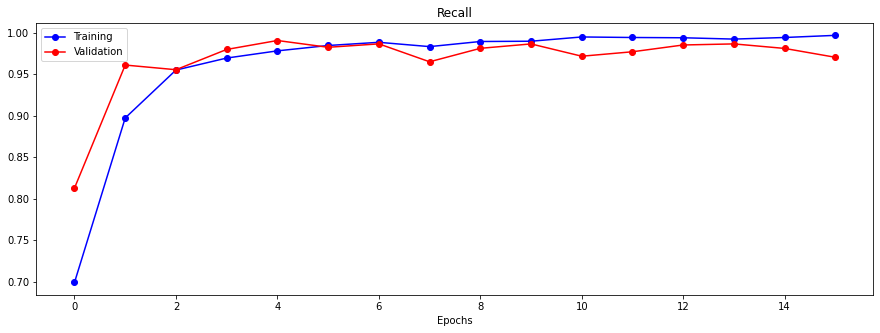

In [145]:
visualize_training_results(results_5)

This is definitely special in the sense that the model performed better on Validation set than on the Training set. 

In [146]:
# MAKE PREDICTIONS USING THE EVALUATION GENERATORS
preds_train_5 = cnn_5.predict(train_eval_generator, 
                           steps=(train_generator.n//BATCH_SIZE+1), 
                           verbose=1,
                           workers=8)
preds_val_5 = cnn_5.predict(val_eval_generator, 
                         steps=(val_generator.n//BATCH_SIZE+1),
                         verbose=1,
                         workers=8)

33/33 [==============================] - 7s 154ms/step


In [150]:
cnn_5_metrics = cnn_5.evaluate(val_eval_generator)
perf_df.loc[len(perf_df.index)] = ['cnn_5'] + cnn_5_metrics
perf_df

33/33 [==============================] - 9s 267ms/step - loss: 0.0736 - accuracy: 0.9733 - recall: 0.9828 - precision: 0.9802


,model,loss,accuracy,recall,precision
0,baseline,0.071304,0.978032,0.988111,0.981627
1,cnn_2,0.089041,0.976122,0.981506,0.985411
2,cnn_3,0.086928,0.978032,0.988111,0.981627
3,cnn_4,0.098447,0.973257,0.973580,0.989262
4,cnn_5,0.073628,0.973257,0.982827,0.980237


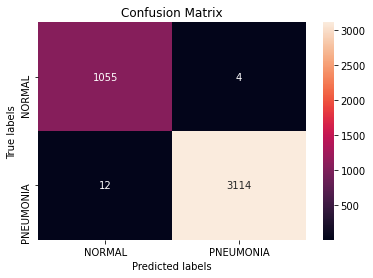

In [147]:
# PLOT CONFUSION MATRIX FOR TRAINING SET
# (converting predicted values from float to nearest integer)
plot_confusionmatrix(train_df['label'], np.rint(preds_train_5)) 

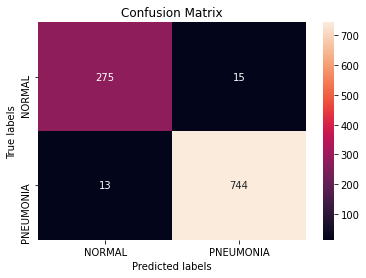

In [148]:
# PLOT CONFUSION MATRIX FOR VALIDATION SET
plot_confusionmatrix(val_df['label'], np.rint(preds_val_5))

In [149]:
# APPEND PREDICTIONS OF THE cnn_5 MODEL TO val_df FOR COMPARISON WITH
# OTHER MODELS LATER
val_df['cnn_5_pred'] = preds_val_5
val_df.head()

,image,label,type,baseline_pred,cnn_2_pred,cnn_3_pred,cnn_4_pred,cnn_5_pred
240,../input/chest-xray-pneumonia/chest_xray/train...,0,normal,0.000323,0.016438,0.000553,0.071391,0.001856
584,../input/chest-xray-pneumonia/chest_xray/train...,0,normal,0.001018,0.017792,0.000179,0.071391,0.000120
2259,../input/chest-xray-pneumonia/chest_xray/train...,1,bacteria,0.999959,0.998083,0.999969,0.999994,0.985606
1420,../input/chest-xray-pneumonia/chest_xray/train...,1,virus,0.369866,0.313631,0.533788,0.071391,0.341139
1835,../input/chest-xray-pneumonia/chest_xray/train...,1,virus,0.999983,0.999974,0.999999,0.999998,0.993541


In [152]:
# PNEUMONIA CASES THAT HAVE BEEN INCORRECTLY PREDICTED BY cnn_5
fn5 = val_df[(val_df.label - np.rint(val_df.cnn_5_pred)) == 1]
fn5

,image,label,type,baseline_pred,cnn_2_pred,cnn_3_pred,cnn_4_pred,cnn_5_pred
1420,../input/chest-xray-pneumonia/chest_xray/train...,1,virus,0.369866,0.313631,0.533788,0.071391,0.341139
4118,../input/chest-xray-pneumonia/chest_xray/train...,1,virus,0.637929,0.739685,0.958825,0.197294,0.414570
3165,../input/chest-xray-pneumonia/chest_xray/train...,1,bacteria,0.505009,0.453172,0.675485,0.071391,0.436152
4624,../input/chest-xray-pneumonia/chest_xray/train...,1,virus,0.098634,0.412647,0.020190,0.071391,0.091455
4449,../input/chest-xray-pneumonia/chest_xray/train...,1,virus,0.093277,0.258000,0.032067,0.071391,0.037194
1658,../input/chest-xray-pneumonia/chest_xray/train...,1,virus,0.017062,0.313802,0.007826,0.071391,0.007202
5190,../input/chest-xray-pneumonia/chest_xray/train...,1,virus,0.002578,0.056724,0.002272,0.071391,0.018217
4299,../input/chest-xray-pneumonia/chest_xray/train...,1,virus,0.899709,0.331328,0.805248,0.600703,0.350742
4906,../input/chest-xray-pneumonia/chest_xray/train...,1,bacteria,0.206189,0.104631,0.070067,0.071391,0.023482
4529,../input/chest-xray-pneumonia/chest_xray/train...,1,virus,0.389061,0.229874,0.447499,0.071391,0.430963


In [153]:
# PNEUMONIA CASES THAT HAVE BEEN INCORRECTLY PREDICTED BY 4 MODELS
# baseline, cnn_3, cnn_4 and cnn_5
fn_all = val_df[((val_df.label - np.rint(val_df.baseline_pred)) == 1) & \
                (np.rint(val_df.baseline_pred) == np.rint(val_df.cnn_5_pred)) & \
                (np.rint(val_df.baseline_pred) == np.rint(val_df.cnn_4_pred)) & \
                (np.rint(val_df.baseline_pred) == np.rint(val_df.cnn_3_pred))]
fn_all

,image,label,type,baseline_pred,cnn_2_pred,cnn_3_pred,cnn_4_pred,cnn_5_pred
4624,../input/chest-xray-pneumonia/chest_xray/train...,1,virus,0.098634,0.412647,0.020190,0.071391,0.091455
4449,../input/chest-xray-pneumonia/chest_xray/train...,1,virus,0.093277,0.258000,0.032067,0.071391,0.037194
1658,../input/chest-xray-pneumonia/chest_xray/train...,1,virus,0.017062,0.313802,0.007826,0.071391,0.007202
5190,../input/chest-xray-pneumonia/chest_xray/train...,1,virus,0.002578,0.056724,0.002272,0.071391,0.018217
4906,../input/chest-xray-pneumonia/chest_xray/train...,1,bacteria,0.206189,0.104631,0.070067,0.071391,0.023482
4529,../input/chest-xray-pneumonia/chest_xray/train...,1,virus,0.389061,0.229874,0.447499,0.071391,0.430963
1839,../input/chest-xray-pneumonia/chest_xray/train...,1,bacteria,0.157971,0.616528,0.048777,0.071391,0.346738


In [154]:
fn_generator = ImageDataGenerator(rescale=1.0/255).flow_from_dataframe(
    dataframe=fn_all, x_col='image', y_col='cnn_5_pred',
    class_mode='raw',
    color_mode='grayscale',
    target_size=(180,180), batch_size=BATCH_SIZE,
    shuffle=False
)

fn_images, fn_prob = next(fn_generator)

Found 7 validated image filenames.


PNEUMONIA cases predicted as NORMAL by all 4 models baseline, cnn_3, cnn_4, and cnn_5



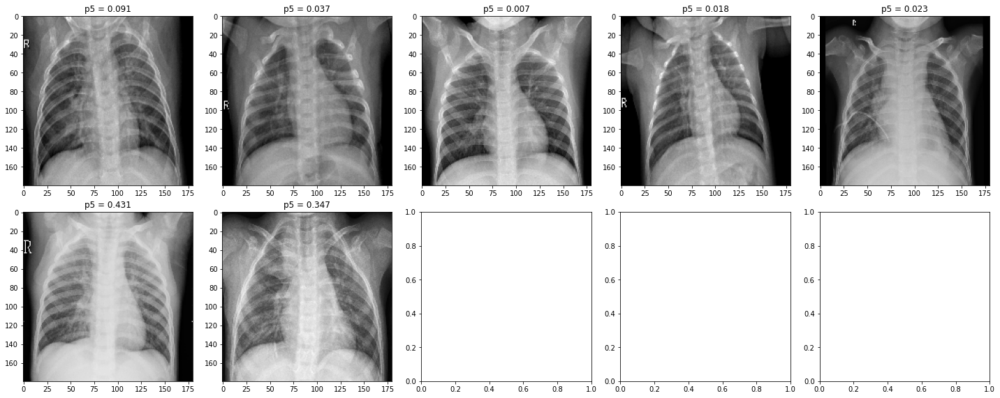

In [155]:
print('PNEUMONIA cases predicted as NORMAL by all 4 models baseline, cnn_3, cnn_4, and cnn_5')
print()
fig, axes = plt.subplots(nrows=2, ncols=5, figsize=(20,8))

for i in range(len(fn_all)):
    ax = axes[i // 5][i % 5]
    ax.imshow(fn_images[i], cmap='gray')
    ax.set_title('p5 = {:.3f}'.format(fn_prob[i]))

plt.tight_layout()
plt.show();

In [156]:
val_df[val_df.label==1].describe()

,label,baseline_pred,cnn_2_pred,cnn_3_pred,cnn_4_pred,cnn_5_pred
count,757.0,757.000000,757.000000,757.000000,757.000000,757.000000
mean,1.0,0.982115,0.969014,0.984407,0.970239,0.976953
std,0.0,0.101498,0.110592,0.105119,0.142551,0.103233
min,1.0,0.002578,0.056724,0.002272,0.071391,0.007202
25%,1.0,0.999818,0.991009,0.999947,0.999926,0.988880
50%,1.0,0.999990,0.998886,0.999998,0.999999,0.996606
75%,1.0,1.000000,0.999862,1.000000,1.000000,0.998828
max,1.0,1.000000,1.000000,1.000000,1.000000,0.999975


In [157]:
fn_all.describe()

,label,baseline_pred,cnn_2_pred,cnn_3_pred,cnn_4_pred,cnn_5_pred
count,7.0,7.000000,7.000000,7.000000,7.000000,7.000000
mean,1.0,0.137825,0.284601,0.089814,0.071391,0.136464
std,0.0,0.132032,0.189492,0.159468,0.000000,0.176201
min,1.0,0.002578,0.056724,0.002272,0.071391,0.007202
25%,1.0,0.055170,0.167252,0.014008,0.071391,0.020849
50%,1.0,0.098634,0.258000,0.032067,0.071391,0.037194
75%,1.0,0.182080,0.363224,0.059422,0.071391,0.219096
max,1.0,0.389061,0.616528,0.447499,0.071391,0.430963


In [158]:
perf_df

,model,loss,accuracy,recall,precision
0,baseline,0.071304,0.978032,0.988111,0.981627
1,cnn_2,0.089041,0.976122,0.981506,0.985411
2,cnn_3,0.086928,0.978032,0.988111,0.981627
3,cnn_4,0.098447,0.973257,0.973580,0.989262
4,cnn_5,0.073628,0.973257,0.982827,0.980237


So far among 4 models, `cnn_2` has the highest average probability output for the Pneumonia cases.

In addition, if we look at the average performance of the 5 models on the same 7 PNEUMONIA cases that all 4 out of 5 models misclassified as NORMAL, `cnn_2` has slighly higher average probability than the other 3 by a small margin. Particularly model `cnn_4` seems to be further off than the other 3 models on these.  

So far, among all 5 models,`cnn_5` has my vote. It's been trained using weighted class to correct imbalance data, and the training & validation metrics look more stable in `cnn_5` than in other models, as they appear close to convergence. 

In [ ]:
# SAVE THE MODEL
cnn_5.save("cnn_5.h5")

### Model #6 - Balanced Model with Data Augmentation

Although the 4th model `cnn_4` did perform relatively well, it produced higher False Negatives than my baseline, which is what we try to minimize in this case. The model can perhaps be improved in terms of robustness by being fed synthesizing additional images from the original dataset to counter class imbalance, and also increase our model's ability to transfer what it's learned to unseen data.

In [160]:
# Reference: https://www.pyimagesearch.com/2018/12/24/how-to-use-keras-fit-and-fit_generator-a-hands-on-tutorial/

# CREATE AN AUGMENTATION GENERATOR FOR TRAINING DATASET
aug = ImageDataGenerator(rescale=1.0/255,
                         horizontal_flip=True,
                         rotation_range=10)

- Horizontal flip is going to flip the heart to the right, which might help our model detect cases in which the patiences have this condition. However, it's not too common, so it might end up hurting the model's learning. 
- Some of the images in the dataset seem to be slightly rotated (2 of the 7 Pneumonia cases that have been consistenly missed by all 5 models are rotated to the left) so I think including this would provide additional information for the model.

In [161]:
# CREATE NEW GENERATOR FOR TRAINING DATA (FROM train_df DATAFRAME)
aug_train_generator = aug.flow_from_dataframe(
    dataframe=train_df, x_col='image', y_col='label',
    color_mode='grayscale',
    class_mode='raw',
    target_size=(180,180), 
    batch_size=BATCH_SIZE,
    seed=42,
    shuffle=True   # shuffle so we're not missing out on any samples
)

Found 4185 validated image filenames.


In [162]:
images_train, labels_train = next(aug_train_generator)

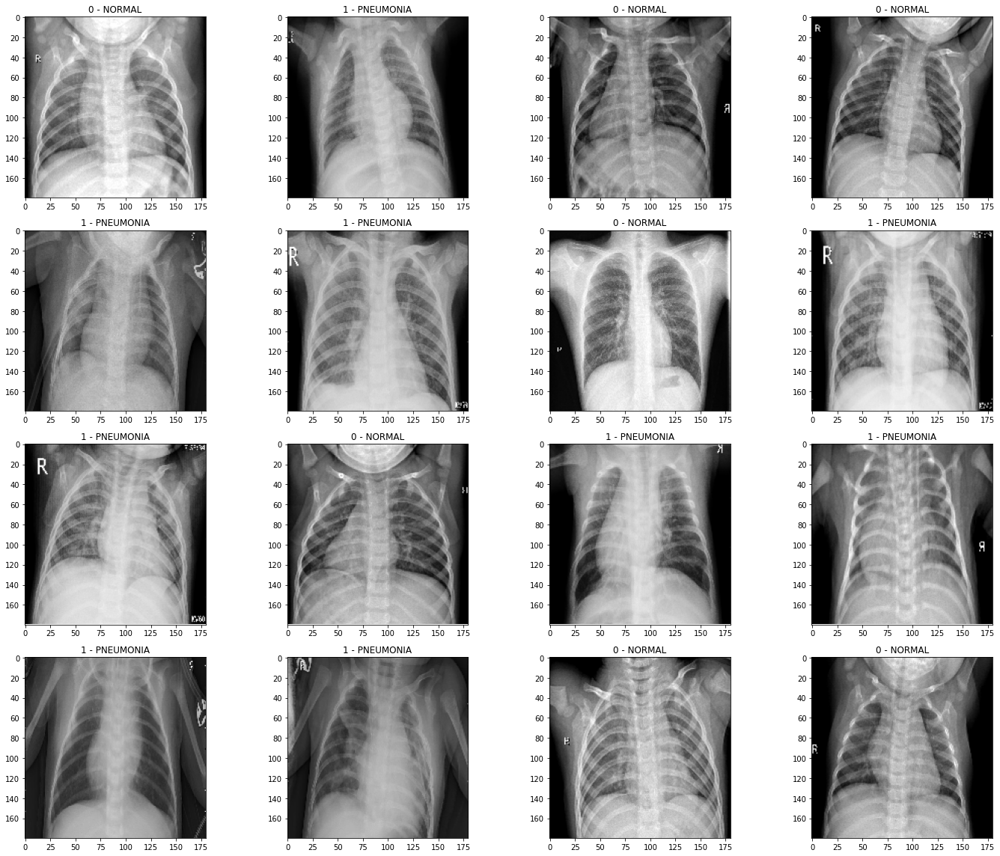

In [163]:
fig, axes = plt.subplots(nrows=4, ncols=4, figsize=(20,16))
label_output = {0: 'NORMAL', 1: 'PNEUMONIA'}
i = range(16)

for i in range(16):
    ax = axes[i // 4][i % 4]
    ax.imshow(images_train[i], cmap='gray')
    ax.set_title(f'{labels_train[i]} - {label_output[labels_train[i]]}')
    
plt.tight_layout()
plt.show();

In [166]:
# RECONSTRUCT cnn_5 WITH THE SAME ARCHITECTURE - called cnn_6
cnn_6 = Sequential()
cnn_6.add(Conv2D(32, (3,3), activation='relu', padding='same',
               input_shape=[180,180,1]))
cnn_6.add(MaxPooling2D(pool_size=(2,2)))
cnn_6.add(Flatten())
cnn_6.add(Dense(64, activation='relu'))
cnn_6.add(Dropout(0.3))
cnn_6.add(Dense(32, activation='relu'))
cnn_6.add(Dropout(0.3))
cnn_6.add(Dense(1, activation='sigmoid'))

In [167]:
cnn_6.compile(loss='binary_crossentropy',
                 optimizer='adam',
                 metrics=['accuracy', recall, precision])

cnn_6.summary()

Model: "sequential_7"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_9 (Conv2D)            (None, 180, 180, 32)      320       
_________________________________________________________________
max_pooling2d_8 (MaxPooling2 (None, 90, 90, 32)        0         
_________________________________________________________________
flatten_7 (Flatten)          (None, 259200)            0         
_________________________________________________________________
dense_18 (Dense)             (None, 64)                16588864  
_________________________________________________________________
dropout_4 (Dropout)          (None, 64)                0         
_________________________________________________________________
dense_19 (Dense)             (None, 32)                2080      
_________________________________________________________________
dropout_5 (Dropout)          (None, 32)               

In [168]:
checkpoint_cb = ModelCheckpoint('cnn_6.h5',
                                save_best_only=True)
early_stopping_cb = EarlyStopping(patience=10,
                                  restore_best_weights=True)

BATCH_SIZE = 32
EPOCHS = 30

results_6 = cnn_6.fit(aug_train_generator, 
                      validation_data=val_generator,
                      epochs=EPOCHS,
                      class_weight=class_weight,
                      steps_per_epoch=(aug_train_generator.n//BATCH_SIZE),
                      validation_steps=(val_generator.n//BATCH_SIZE),
                      callbacks=[checkpoint_cb, early_stopping_cb])

Epoch 1/30
130/130 [==============================] - 55s 416ms/step - loss: 1.1824 - accuracy: 0.5321 - recall: 0.7138 - precision: 0.8857 - val_loss: 0.3420 - val_accuracy: 0.9277 - val_recall: 0.9420 - val_precision: 0.9575
Epoch 2/30
130/130 [==============================] - 54s 415ms/step - loss: 0.4102 - accuracy: 0.7678 - recall: 0.7445 - precision: 0.9326 - val_loss: 0.2722 - val_accuracy: 0.9082 - val_recall: 0.8755 - val_precision: 0.9969
Epoch 3/30
130/130 [==============================] - 53s 405ms/step - loss: 0.2749 - accuracy: 0.9103 - recall: 0.9174 - precision: 0.9626 - val_loss: 0.1628 - val_accuracy: 0.9541 - val_recall: 0.9432 - val_precision: 0.9929
Epoch 4/30
130/130 [==============================] - 53s 412ms/step - loss: 0.2289 - accuracy: 0.9302 - recall: 0.9472 - precision: 0.9597 - val_loss: 0.1448 - val_accuracy: 0.9482 - val_recall: 0.9364 - val_precision: 0.9914
Epoch 5/30
130/130 [==============================] - 53s 410ms/step - loss: 0.2053 - accura

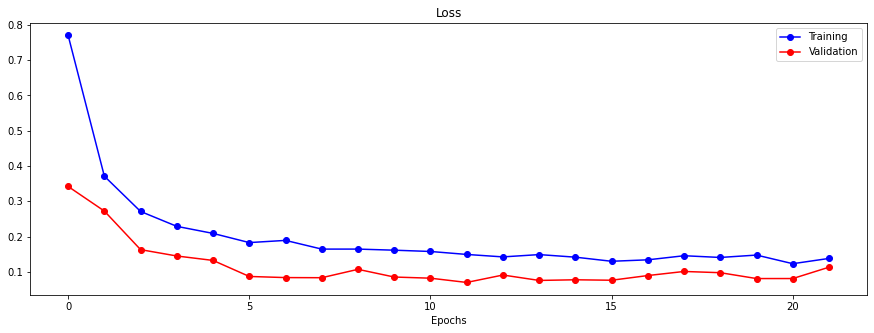

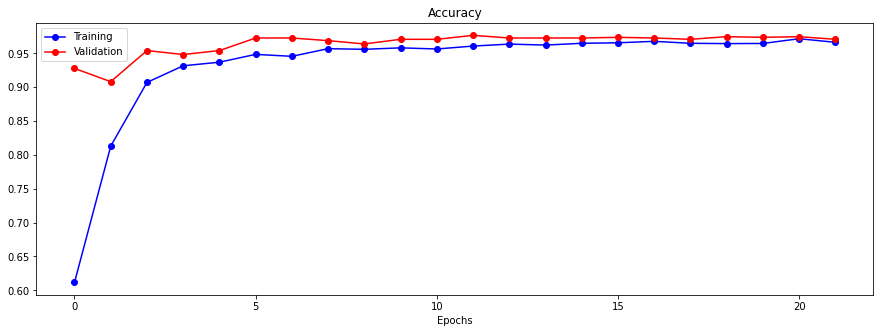

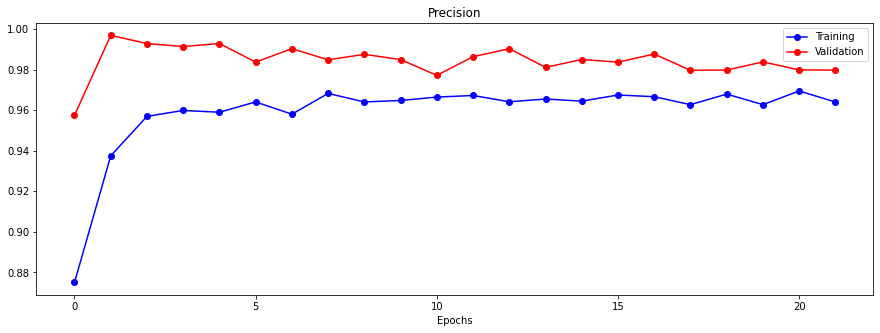

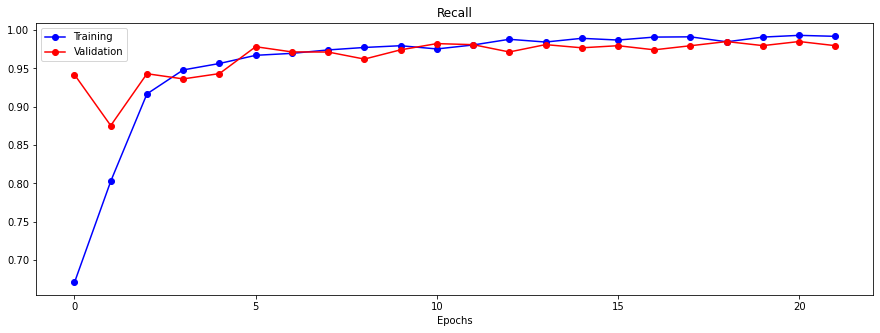

In [169]:
visualize_training_results(results_6)

These plots are definitely not bad lookng.

In [170]:
train_eval_generator_aug = aug.flow_from_dataframe(
    dataframe=train_df, x_col='image', y_col='label',
    class_mode='raw',
    color_mode='grayscale',
    target_size=(180,180), 
    batch_size=BATCH_SIZE,
    seed=2021,
    shuffle=False     # not shuffle so that the predicts come out in the same order as in the original dataset
)

preds_train_6 = cnn_6.predict(train_eval_generator_aug, 
                                steps=(train_eval_generator_aug.n//BATCH_SIZE+1), 
                                verbose=1,
                                workers=8)
preds_val_6 = cnn_6.predict(val_eval_generator, 
                              steps=(val_eval_generator.n//BATCH_SIZE+1),
                              verbose=1,
                              workers=8)

Found 4185 validated image filenames.
33/33 [==============================] - 8s 157ms/step


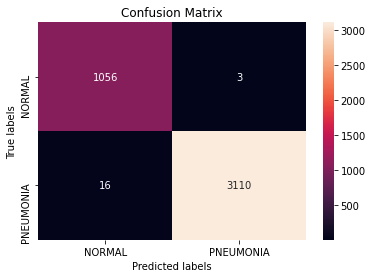

In [171]:
plot_confusionmatrix(train_df['label'], np.rint(preds_train_6))

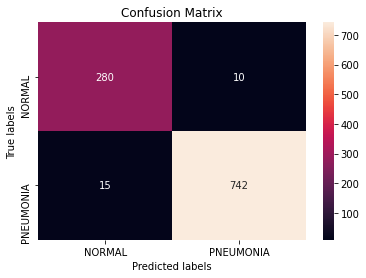

In [172]:
plot_confusionmatrix(val_df['label'], np.rint(preds_val_6)) 

In [173]:
cnn_6_metrics = cnn_6.evaluate(val_eval_generator)
perf_df.loc[len(perf_df.index)] = ['cnn_6'] + cnn_6_metrics
perf_df

33/33 [==============================] - 9s 265ms/step - loss: 0.0696 - accuracy: 0.9761 - recall: 0.9802 - precision: 0.9867


,model,loss,accuracy,recall,precision
0,baseline,0.071304,0.978032,0.988111,0.981627
1,cnn_2,0.089041,0.976122,0.981506,0.985411
2,cnn_3,0.086928,0.978032,0.988111,0.981627
3,cnn_4,0.098447,0.973257,0.973580,0.989262
4,cnn_5,0.073628,0.973257,0.982827,0.980237
5,cnn_6,0.069640,0.976122,0.980185,0.986702


In [198]:
# APPEND PREDICTIONS OF THE cnn_5 MODEL TO val_df FOR COMPARISON WITH
# OTHER MODELS LATER
val_df['cnn_6_pred'] = preds_val_6
val_df.head()

,image,label,type,baseline_pred,cnn_2_pred,cnn_3_pred,cnn_4_pred,cnn_5_pred,cnn_7_pred,cnn_6_pred
240,../input/chest-xray-pneumonia/chest_xray/train...,0,normal,0.000323,0.016438,0.000553,0.071391,0.001856,3.054815e-07,0.000933
584,../input/chest-xray-pneumonia/chest_xray/train...,0,normal,0.001018,0.017792,0.000179,0.071391,0.000120,1.413198e-07,0.000774
2259,../input/chest-xray-pneumonia/chest_xray/train...,1,bacteria,0.999959,0.998083,0.999969,0.999994,0.985606,1.000000e+00,0.992785
1420,../input/chest-xray-pneumonia/chest_xray/train...,1,virus,0.369866,0.313631,0.533788,0.071391,0.341139,1.937371e-01,0.068023
1835,../input/chest-xray-pneumonia/chest_xray/train...,1,virus,0.999983,0.999974,0.999999,0.999998,0.993541,1.000000e+00,0.999432


In [174]:
# SAVE THE MODEL
cnn_6.save("cnn_6.h5")

In [175]:
test_df.sample(10, random_state=2021)

,image,label
285,../input/chest-xray-pneumonia/chest_xray/test/...,1
28,../input/chest-xray-pneumonia/chest_xray/test/...,0
457,../input/chest-xray-pneumonia/chest_xray/test/...,1
286,../input/chest-xray-pneumonia/chest_xray/test/...,1
141,../input/chest-xray-pneumonia/chest_xray/test/...,0
599,../input/chest-xray-pneumonia/chest_xray/test/...,1
269,../input/chest-xray-pneumonia/chest_xray/test/...,1
209,../input/chest-xray-pneumonia/chest_xray/test/...,0
232,../input/chest-xray-pneumonia/chest_xray/test/...,0
177,../input/chest-xray-pneumonia/chest_xray/test/...,0


In [176]:
BATCH_SIZE = 32

test_generator = ImageDataGenerator(rescale=1.0/255).flow_from_dataframe(
    dataframe=test_df, x_col='image', y_col='label',
    class_mode='raw',
    color_mode='grayscale',
    target_size=(180,180), batch_size=BATCH_SIZE,
    seed=2021,
    shuffle=False
)

Found 624 validated image filenames.


In [177]:
master_generator = ImageDataGenerator(rescale=1.0/255).flow_from_dataframe(
    dataframe=master_df, x_col='image', y_col='label',
    class_mode='raw',
    color_mode='grayscale',
    target_size=(180,180), batch_size=BATCH_SIZE,
    seed=2021,
    shuffle=True
)

Found 5232 validated image filenames.


In [178]:
preds_test_6 = cnn_6.predict(test_generator, 
                             steps=(test_generator.n//BATCH_SIZE+1),
                             verbose=1,
                             workers=8)

20/20 [==============================] - 4s 89ms/step


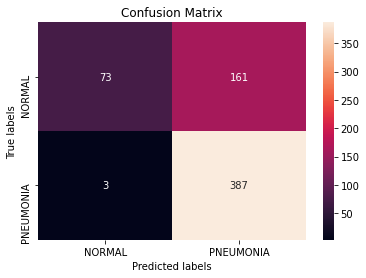

In [179]:
plot_confusionmatrix(test_df['label'], np.rint(preds_test_6)) 

In [180]:
cnn_6.evaluate(test_generator)

20/20 [==============================] - 4s 216ms/step - loss: 0.9179 - accuracy: 0.7372 - recall: 0.9923 - precision: 0.7062


[0.9178804159164429, 0.7371794581413269, 0.9923076629638672, 0.706204354763031]

### Model #7 - Transfer Learning with ResNet

In [ ]:
# Resources: 
# https://machinelearningmastery.com/how-to-use-transfer-learning-when-developing-convolutional-neural-network-models/
# https://www.kaggle.com/suniliitb96/tutorial-keras-transfer-learning-with-resnet50

In [49]:
from keras.applications.resnet50 import ResNet50

Since ResNet50 expects a (224, 224, 3) input shape, I would recreate train/val/test generators accordingly.

In [182]:
BATCH_SIZE = 32
IMG_SIZE = (224, 224)

# CREATE GENERATOR FOR TRAINING DATA (FROM train_df DATAFRAME)
resnet_train_generator = ImageDataGenerator(rescale=1.0/255).flow_from_dataframe(
    dataframe=train_df, x_col='image', y_col='label',
    color_mode='rgb',    # 3 channels
    class_mode='raw',
    target_size=IMG_SIZE, 
    batch_size=BATCH_SIZE,
    seed=42,
    shuffle=True   # shuffle so we're not missing out on any samples
)

# CREATE GENERATOR FOR VALIDATION DATA (FROM val_df DATAFRAME)
resnet_val_generator = ImageDataGenerator(rescale=1.0/255).flow_from_dataframe(
    dataframe=val_df, x_col='image', y_col='label',
    color_mode='rgb',    # 3 channels   
    class_mode='raw',
    target_size=IMG_SIZE, 
    batch_size=BATCH_SIZE,
    seed=42,
    shuffle=True
)

Found 4185 validated image filenames.
Found 1047 validated image filenames.


In [183]:
cnn_7 = Sequential()

# first layer would be NON-TRAINABLE (using pre-trained ResNet weights as is)
base_model = ResNet50(weights='imagenet',
                      include_top=False,
                      pooling='avg')
cnn_7.add(base_model)
cnn_7.add(Dense(1, activation='sigmoid'))

# freeze the weights of base model:
for layer in base_model.layers:
    layer.trainable = False

94773248/94765736 [==============================] - 1s 0us/step


In [51]:
from keras.optimizers import SGD

In [185]:
# USING SGD TO CUSTOMIZE LEARNING RATE
sgd = SGD(lr=0.02, decay=0.01, momentum=0.9)
cnn_7.compile(optimizer=sgd, 
              loss='binary_crossentropy',
              metrics=['accuracy', recall, precision])
cnn_7.summary()

Model: "sequential_8"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
resnet50 (Functional)        (None, 2048)              23587712  
_________________________________________________________________
dense_21 (Dense)             (None, 1)                 2049      
Total params: 23,589,761
Trainable params: 2,049
Non-trainable params: 23,587,712
_________________________________________________________________


In [186]:
checkpoint_cb = ModelCheckpoint('cnn_7.h5',
                                save_best_only=True,
                                monitor='val_loss',
                                mode='min')
early_stopping_cb = EarlyStopping(patience=3,
                                  restore_best_weights=True,
                                  monitor='val_loss',
                                  mode='min')

EPOCHS = 5

results_7 = cnn_7.fit(resnet_train_generator, 
                      validation_data=resnet_val_generator,
                      epochs=EPOCHS,
                      class_weight=class_weight,
                      steps_per_epoch=(resnet_train_generator.n//BATCH_SIZE),
                      validation_steps=(resnet_val_generator.n//BATCH_SIZE),
                      callbacks=[checkpoint_cb, early_stopping_cb])

Epoch 1/5
130/130 [==============================] - 57s 412ms/step - loss: 2.8894 - accuracy: 0.5106 - recall: 0.6438 - precision: 0.7350 - val_loss: 0.4096 - val_accuracy: 0.8135 - val_recall: 0.8932 - val_precision: 0.8551
Epoch 2/5
130/130 [==============================] - 54s 417ms/step - loss: 0.8515 - accuracy: 0.6291 - recall: 0.6269 - precision: 0.8325 - val_loss: 0.4049 - val_accuracy: 0.8232 - val_recall: 0.8693 - val_precision: 0.8848
Epoch 3/5
130/130 [==============================] - 54s 416ms/step - loss: 0.5502 - accuracy: 0.7481 - recall: 0.7458 - precision: 0.8977 - val_loss: 0.4932 - val_accuracy: 0.8027 - val_recall: 0.7709 - val_precision: 0.9470
Epoch 4/5
130/130 [==============================] - 53s 408ms/step - loss: 0.4627 - accuracy: 0.8072 - recall: 0.8005 - precision: 0.9313 - val_loss: 0.5301 - val_accuracy: 0.7822 - val_recall: 0.7332 - val_precision: 0.9561
Epoch 5/5
130/130 [==============================] - 53s 404ms/step - loss: 0.4676 - accuracy: 0

In [187]:
# unfreeze base_model layers:
for layer in base_model.layers:
    layer.trainable = True

In [188]:
# REDUCING LEARNING RATE TO 0.01 TO AVOID DAMANGING THE PRETRAINED WEIGHTS
sgd = SGD(lr=0.01, decay=0.001, momentum=0.9)

# RE-COMPILE MODEL AFTER UNFREEZING ALL LAYERS
cnn_7.compile(optimizer=sgd, 
              loss='binary_crossentropy',
              metrics=['accuracy', recall, precision])

cnn_7.summary()

Model: "sequential_8"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
resnet50 (Functional)        (None, 2048)              23587712  
_________________________________________________________________
dense_21 (Dense)             (None, 1)                 2049      
Total params: 23,589,761
Trainable params: 23,536,641
Non-trainable params: 53,120
_________________________________________________________________


In [189]:
checkpoint_cb = ModelCheckpoint('cnn_7.h5',
                                save_best_only=True,
                                monitor='val_loss',
                                mode='min')
early_stopping_cb = EarlyStopping(patience=10,
                                  restore_best_weights=True,
                                  monitor='val_loss',
                                  mode='min')

EPOCHS = 30

results_7 = cnn_7.fit(resnet_train_generator, 
                      validation_data=resnet_val_generator,
                      epochs=EPOCHS,
                      class_weight=class_weight,
                      steps_per_epoch=(resnet_train_generator.n//BATCH_SIZE),
                      validation_steps=(resnet_val_generator.n//BATCH_SIZE),
                      callbacks=[checkpoint_cb, early_stopping_cb])

Epoch 1/30
130/130 [==============================] - 63s 446ms/step - loss: 0.5612 - accuracy: 0.8655 - recall: 0.8944 - precision: 0.9215 - val_loss: 3.5700 - val_accuracy: 0.2764 - val_recall: 0.0000e+00 - val_precision: 0.0000e+00
Epoch 2/30
130/130 [==============================] - 57s 439ms/step - loss: 0.0465 - accuracy: 0.9806 - recall: 0.9801 - precision: 0.9940 - val_loss: 7.2606 - val_accuracy: 0.7236 - val_recall: 1.0000 - val_precision: 0.7236
Epoch 3/30
130/130 [==============================] - 57s 439ms/step - loss: 0.0134 - accuracy: 0.9947 - recall: 0.9934 - precision: 0.9994 - val_loss: 8.6006 - val_accuracy: 0.7236 - val_recall: 1.0000 - val_precision: 0.7236
Epoch 4/30
130/130 [==============================] - 57s 438ms/step - loss: 0.0059 - accuracy: 0.9985 - recall: 0.9981 - precision: 0.9998 - val_loss: 8.6831 - val_accuracy: 0.7236 - val_recall: 1.0000 - val_precision: 0.7236
Epoch 5/30
130/130 [==============================] - 57s 437ms/step - loss: 0.0103 

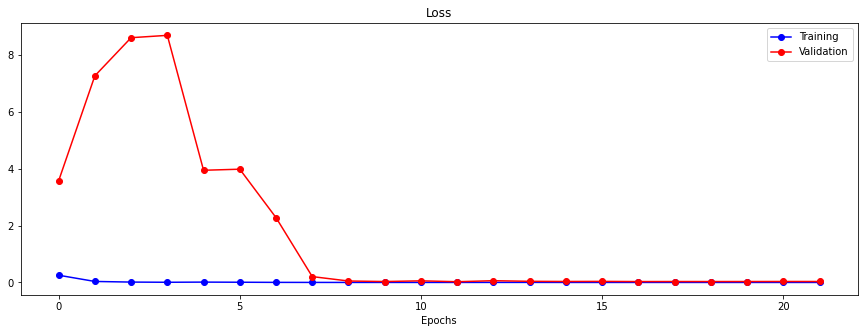

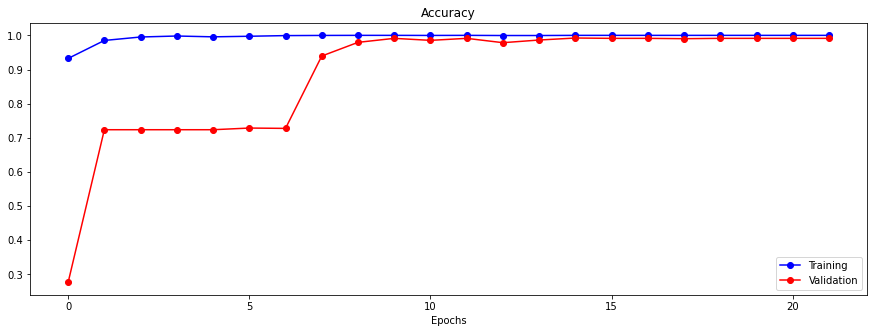

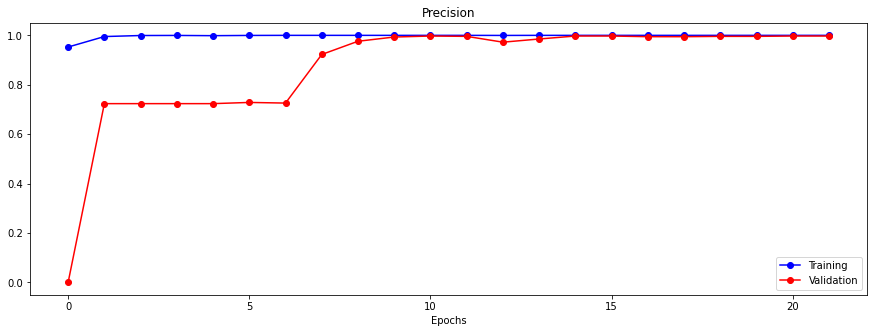

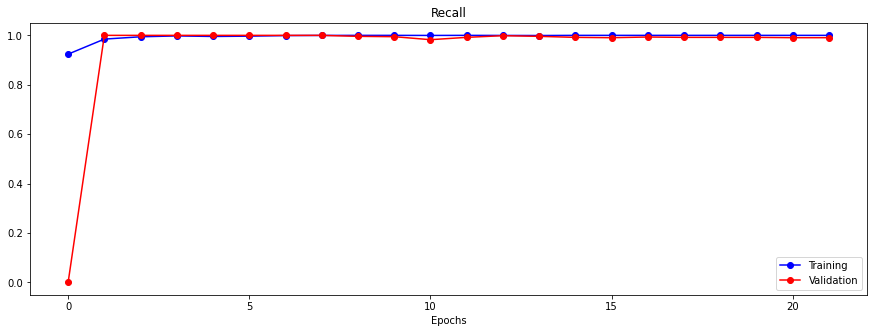

In [190]:
visualize_training_results(results_7)

It's actually very interesting to see how the model appeared to be "stuck" at a local optima(?) the first 7 epochs and barely made any progress, and then turned around and increased accuracy by over 20% from epoch 7 to epoch 8.

In [191]:
# CREATE GENERATOR FOR TRAINING DATA (FROM train_df DATAFRAME)
resnet_train_eval_generator = ImageDataGenerator(rescale=1.0/255).flow_from_dataframe(
    dataframe=train_df, x_col='image', y_col='label',
    color_mode='rgb',    # 3 channels
    class_mode='raw',
    target_size=IMG_SIZE, 
    batch_size=BATCH_SIZE,
    seed=42,
    shuffle=False   # shuffle so we're not missing out on any samples
)

# CREATE GENERATOR FOR VALIDATION DATA (FROM val_df DATAFRAME)
resnet_val_eval_generator = ImageDataGenerator(rescale=1.0/255).flow_from_dataframe(
    dataframe=val_df, x_col='image', y_col='label',
    color_mode='rgb',    # 3 channels   
    class_mode='raw',
    target_size=IMG_SIZE, 
    batch_size=BATCH_SIZE,
    seed=42,
    shuffle=False
)

preds_train_7 = cnn_7.predict(resnet_train_eval_generator, 
                                steps=(resnet_train_eval_generator.n//BATCH_SIZE+1), 
                                verbose=1,
                                workers=8)
preds_val_7 = cnn_7.predict(resnet_val_eval_generator, 
                              steps=(resnet_val_eval_generator.n//BATCH_SIZE+1),
                              verbose=1,
                              workers=8)

Found 4185 validated image filenames.
Found 1047 validated image filenames.
33/33 [==============================] - 10s 236ms/step


In [192]:
cnn_7_metrics = cnn_7.evaluate(resnet_val_eval_generator)

33/33 [==============================] - 11s 326ms/step - loss: 0.0288 - accuracy: 0.9904 - recall: 0.9908 - precision: 0.9960


In [196]:
perf_df.loc[len(perf_df.index)] = ['cnn_7'] + cnn_7_metrics
perf_df

,model,loss,accuracy,recall,precision
0,baseline,0.071304,0.978032,0.988111,0.981627
1,cnn_2,0.089041,0.976122,0.981506,0.985411
2,cnn_3,0.086928,0.978032,0.988111,0.981627
3,cnn_4,0.098447,0.973257,0.973580,0.989262
4,cnn_5,0.073628,0.973257,0.982827,0.980237
5,cnn_6,0.069640,0.976122,0.980185,0.986702
6,cnn_7,0.028789,0.990449,0.990753,0.996016


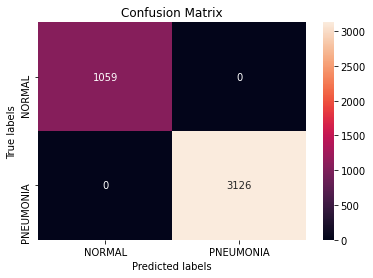

In [193]:
plot_confusionmatrix(train_df['label'], np.rint(preds_train_7))

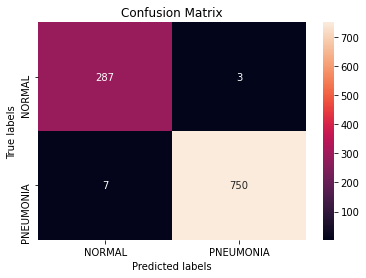

In [195]:
plot_confusionmatrix(val_df['label'], np.rint(preds_val_7))

In [200]:
# APPEND PREDICTIONS OF THE cnn_7 MODEL TO val_df FOR COMPARISON WITH
# OTHER MODELS LATER
val_df['cnn_7_pred'] = preds_val_7

In [201]:
val_df.head(10)

,image,label,type,baseline_pred,cnn_2_pred,cnn_3_pred,cnn_4_pred,cnn_5_pred,cnn_7_pred,cnn_6_pred
240,../input/chest-xray-pneumonia/chest_xray/train...,0,normal,0.000323,0.016438,0.000553,0.071391,0.001856,3.054815e-07,0.000933
584,../input/chest-xray-pneumonia/chest_xray/train...,0,normal,0.001018,0.017792,0.000179,0.071391,0.000120,1.413198e-07,0.000774
2259,../input/chest-xray-pneumonia/chest_xray/train...,1,bacteria,0.999959,0.998083,0.999969,0.999994,0.985606,1.000000e+00,0.992785
1420,../input/chest-xray-pneumonia/chest_xray/train...,1,virus,0.369866,0.313631,0.533788,0.071391,0.341139,1.937371e-01,0.068023
1835,../input/chest-xray-pneumonia/chest_xray/train...,1,virus,0.999983,0.999974,0.999999,0.999998,0.993541,1.000000e+00,0.999432
80,../input/chest-xray-pneumonia/chest_xray/train...,0,normal,0.023024,0.049978,0.024287,0.071391,0.006940,2.576026e-03,0.006589
3859,../input/chest-xray-pneumonia/chest_xray/train...,1,bacteria,1.000000,0.999783,1.000000,1.000000,0.999268,9.999999e-01,0.999956
952,../input/chest-xray-pneumonia/chest_xray/train...,0,normal,0.069374,0.030089,0.010289,0.071391,0.017063,8.330103e-05,0.008896
4431,../input/chest-xray-pneumonia/chest_xray/train...,1,bacteria,0.998966,0.814204,0.999921,0.999216,0.958747,9.999940e-01,0.954366
1260,../input/chest-xray-pneumonia/chest_xray/train...,0,normal,0.000427,0.010076,0.000217,0.071391,0.000056,5.328457e-05,0.001388


In [199]:
# SAVE MODEL 7
cnn_7.save("cnn_7.h5")

In [202]:
# PNEUMONIA CASES THAT HAVE BEEN INCORRECTLY PREDICTED BY cnn_7
fn7 = val_df[(val_df.label - np.rint(val_df.cnn_7_pred)) == 1]
fn7

,image,label,type,baseline_pred,cnn_2_pred,cnn_3_pred,cnn_4_pred,cnn_5_pred,cnn_7_pred,cnn_6_pred
1420,../input/chest-xray-pneumonia/chest_xray/train...,1,virus,0.369866,0.313631,0.533788,0.071391,0.341139,0.193737,0.068023
4449,../input/chest-xray-pneumonia/chest_xray/train...,1,virus,0.093277,0.258000,0.032067,0.071391,0.037194,0.038905,0.035375
1658,../input/chest-xray-pneumonia/chest_xray/train...,1,virus,0.017062,0.313802,0.007826,0.071391,0.007202,0.023925,0.093990
5190,../input/chest-xray-pneumonia/chest_xray/train...,1,virus,0.002578,0.056724,0.002272,0.071391,0.018217,0.336191,0.014482
4080,../input/chest-xray-pneumonia/chest_xray/train...,1,bacteria,0.971223,0.955512,0.978695,0.977166,0.900955,0.033907,0.910427
4113,../input/chest-xray-pneumonia/chest_xray/train...,1,virus,0.585093,0.567164,0.605022,0.517020,0.497964,0.462950,0.667233
1839,../input/chest-xray-pneumonia/chest_xray/train...,1,bacteria,0.157971,0.616528,0.048777,0.071391,0.346738,0.294935,0.212058


In [203]:
# PNEUMONIA CASES THAT HAVE BEEN INCORRECTLY PREDICTED BY 5 MODELS
# baseline, cnn_3, cnn_4, cnn_5, and cnn_7
fn_all = val_df[((val_df.label - np.rint(val_df.baseline_pred)) == 1) & \
                (np.rint(val_df.baseline_pred) == np.rint(val_df.cnn_7_pred)) & \
                (np.rint(val_df.baseline_pred) == np.rint(val_df.cnn_5_pred)) & \
                (np.rint(val_df.baseline_pred) == np.rint(val_df.cnn_4_pred)) & \
                (np.rint(val_df.baseline_pred) == np.rint(val_df.cnn_3_pred))]
fn_all

,image,label,type,baseline_pred,cnn_2_pred,cnn_3_pred,cnn_4_pred,cnn_5_pred,cnn_7_pred,cnn_6_pred
4449,../input/chest-xray-pneumonia/chest_xray/train...,1,virus,0.093277,0.258000,0.032067,0.071391,0.037194,0.038905,0.035375
1658,../input/chest-xray-pneumonia/chest_xray/train...,1,virus,0.017062,0.313802,0.007826,0.071391,0.007202,0.023925,0.093990
5190,../input/chest-xray-pneumonia/chest_xray/train...,1,virus,0.002578,0.056724,0.002272,0.071391,0.018217,0.336191,0.014482
1839,../input/chest-xray-pneumonia/chest_xray/train...,1,bacteria,0.157971,0.616528,0.048777,0.071391,0.346738,0.294935,0.212058


Somehow model `cnn_2` was able to catch 3 of the 7 False Negatives by model `cnn_7`. So far model 7 has the best performance on the validation set. It's also interesting to see how close to 0 or 1 some of the probability outputs by model 7 are.

### Model #8 - ResNet with Data Augmentation

In [78]:
# CREATE AN AUGMENTATION GENERATOR FOR TRAINING DATASET
aug = ImageDataGenerator(rescale=1.0/255,
                         horizontal_flip=True,
                         rotation_range=15)

BATCH_SIZE = 32
IMG_SIZE = (224, 224)

# CREATE GENERATOR FOR TRAINING DATA (FROM train_df DATAFRAME)
resnet_aug_train_generator = aug.flow_from_dataframe(
    dataframe=train_df, x_col='image', y_col='label',
    color_mode='rgb',    # 3 channels
    class_mode='raw',
    target_size=IMG_SIZE, 
    batch_size=BATCH_SIZE,
    seed=42,
    shuffle=True   # shuffle so we're not missing out on any samples
)

# CREATE GENERATOR FOR VALIDATION DATA (FROM val_df DATAFRAME)
resnet_val_generator = ImageDataGenerator(rescale=1.0/255).flow_from_dataframe(
    dataframe=val_df, x_col='image', y_col='label',
    color_mode='rgb',    # 3 channels   
    class_mode='raw',
    target_size=IMG_SIZE, 
    batch_size=BATCH_SIZE,
    seed=42,
    shuffle=True
)

Found 4185 validated image filenames.
Found 1047 validated image filenames.


In [79]:
images_train, labels_train = next(resnet_aug_train_generator)

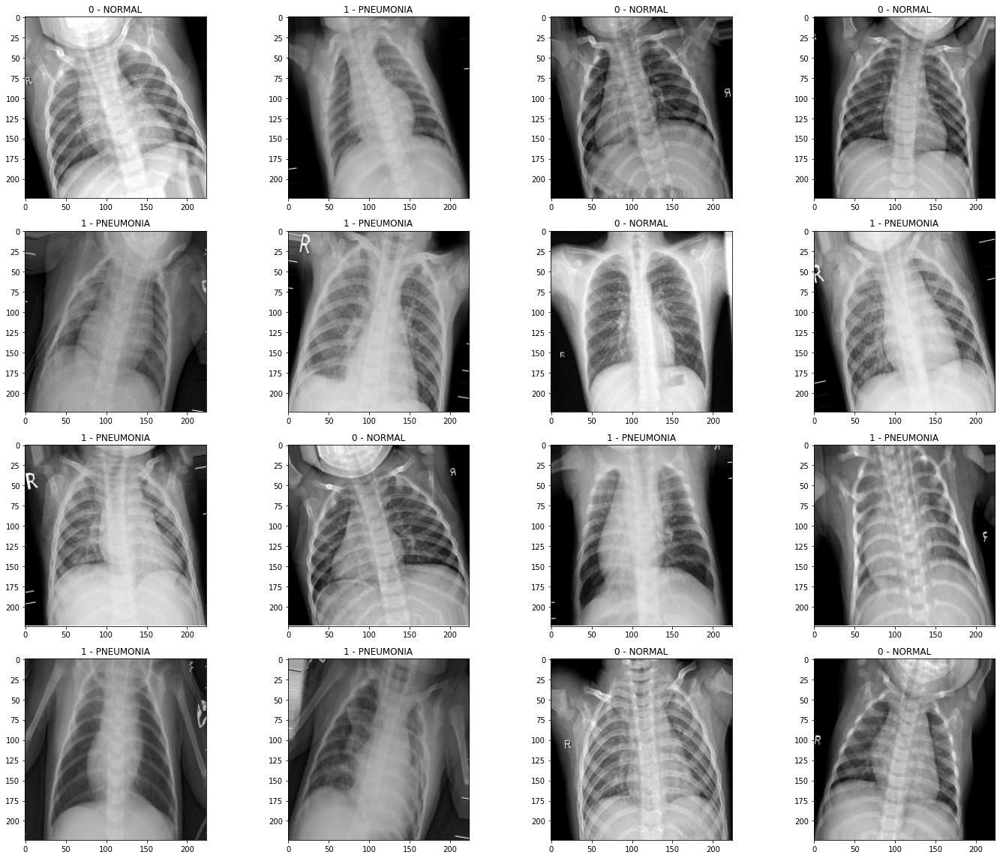

In [80]:
fig, axes = plt.subplots(nrows=4, ncols=4, figsize=(20,16))
label_output = {0: 'NORMAL', 1: 'PNEUMONIA'}
i = range(16)

for i in range(16):
    ax = axes[i // 4][i % 4]
    ax.imshow(images_train[i], cmap='gray')
    ax.set_title(f'{labels_train[i]} - {label_output[labels_train[i]]}')
    
plt.tight_layout()
plt.show();

In [81]:
cnn_8 = Sequential()

# first layer would be NON-TRAINABLE (using pre-trained ResNet weights as is)
base_model = ResNet50(weights='imagenet',
                      include_top=False,
                      pooling='avg')
cnn_8.add(base_model)
cnn_8.add(Dense(1, activation='sigmoid'))

# freeze the weights of base model:
for layer in base_model.layers:
    layer.trainable = False

In [82]:
# USING SGD TO CUSTOMIZE LEARNING RATE
sgd = SGD(lr=0.02, decay=0.01, momentum=0.9)
cnn_8.compile(optimizer=sgd, 
              loss='binary_crossentropy',
              metrics=['accuracy', recall, precision])
cnn_8.summary()

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
resnet50 (Functional)        (None, 2048)              23587712  
_________________________________________________________________
dense_2 (Dense)              (None, 1)                 2049      
Total params: 23,589,761
Trainable params: 2,049
Non-trainable params: 23,587,712
_________________________________________________________________


In [83]:
checkpoint_cb = ModelCheckpoint('cnn_8.h5',
                                save_best_only=True,
                                monitor='val_loss',
                                mode='min')
early_stopping_cb = EarlyStopping(patience=3,
                                  restore_best_weights=True,
                                  monitor='val_loss',
                                  mode='min')

EPOCHS = 5

results_8 = cnn_8.fit(resnet_aug_train_generator, 
                      validation_data=resnet_val_generator,
                      epochs=EPOCHS,
                      class_weight=class_weight,
                      steps_per_epoch=(resnet_aug_train_generator.n//BATCH_SIZE),
                      validation_steps=(resnet_val_generator.n//BATCH_SIZE),
                      callbacks=[checkpoint_cb, early_stopping_cb])

Epoch 1/5
130/130 [==============================] - 92s 683ms/step - loss: 1.1250 - accuracy: 0.5542 - recall: 0.6635 - precision: 0.8438 - val_loss: 0.5190 - val_accuracy: 0.7969 - val_recall: 0.7649 - val_precision: 0.9433
Epoch 2/5
130/130 [==============================] - 87s 670ms/step - loss: 0.8588 - accuracy: 0.6010 - recall: 0.5886 - precision: 0.8257 - val_loss: 0.4240 - val_accuracy: 0.8262 - val_recall: 0.8631 - val_precision: 0.8922
Epoch 3/5
130/130 [==============================] - 87s 672ms/step - loss: 0.5549 - accuracy: 0.7287 - recall: 0.7342 - precision: 0.8868 - val_loss: 0.3969 - val_accuracy: 0.8125 - val_recall: 0.8962 - val_precision: 0.8526
Epoch 4/5
130/130 [==============================] - 87s 672ms/step - loss: 0.5065 - accuracy: 0.7639 - recall: 0.7642 - precision: 0.9037 - val_loss: 0.5874 - val_accuracy: 0.7354 - val_recall: 0.6586 - val_precision: 0.9644
Epoch 5/5
130/130 [==============================] - 87s 670ms/step - loss: 0.5036 - accuracy: 0

In [84]:
# unfreeze base_model layers:
for layer in base_model.layers:
    layer.trainable = True

In [85]:
# REDUCING LEARNING RATE TO 0.01 TO AVOID DAMANGING THE PRETRAINED WEIGHTS
sgd = SGD(lr=0.01, decay=0.001, momentum=0.9)

# RE-COMPILE MODEL AFTER UNFREEZING ALL LAYERS
cnn_8.compile(optimizer=sgd, 
              loss='binary_crossentropy',
              metrics=['accuracy', recall, precision])

cnn_8.summary()

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
resnet50 (Functional)        (None, 2048)              23587712  
_________________________________________________________________
dense_2 (Dense)              (None, 1)                 2049      
Total params: 23,589,761
Trainable params: 23,536,641
Non-trainable params: 53,120
_________________________________________________________________


In [86]:
checkpoint_cb = ModelCheckpoint('cnn_8.h5',
                                save_best_only=True,
                                monitor='val_loss',
                                mode='min')
early_stopping_cb = EarlyStopping(patience=10,
                                  restore_best_weights=True,
                                  monitor='val_loss',
                                  mode='min')

EPOCHS = 30

results_8 = cnn_8.fit(resnet_aug_train_generator, 
                      validation_data=resnet_val_generator,
                      epochs=EPOCHS,
                      class_weight=class_weight,
                      steps_per_epoch=(resnet_aug_train_generator.n//BATCH_SIZE),
                      validation_steps=(resnet_val_generator.n//BATCH_SIZE),
                      callbacks=[checkpoint_cb, early_stopping_cb])

Epoch 1/30
130/130 [==============================] - 99s 729ms/step - loss: 0.4452 - accuracy: 0.8806 - recall: 0.6854 - precision: 0.9773 - val_loss: 2.1169 - val_accuracy: 0.7236 - val_recall: 1.0000 - val_precision: 0.7236
Epoch 2/30
130/130 [==============================] - 93s 717ms/step - loss: 0.0862 - accuracy: 0.9664 - recall: 0.9628 - precision: 0.9919 - val_loss: 3.5267 - val_accuracy: 0.7246 - val_recall: 1.0000 - val_precision: 0.7246
Epoch 3/30
130/130 [==============================] - 94s 719ms/step - loss: 0.0590 - accuracy: 0.9784 - recall: 0.9796 - precision: 0.9917 - val_loss: 3.3246 - val_accuracy: 0.7236 - val_recall: 1.0000 - val_precision: 0.7236
Epoch 4/30
130/130 [==============================] - 94s 719ms/step - loss: 0.0316 - accuracy: 0.9873 - recall: 0.9868 - precision: 0.9963 - val_loss: 4.8720 - val_accuracy: 0.7256 - val_recall: 1.0000 - val_precision: 0.7256
Epoch 5/30
130/130 [==============================] - 94s 721ms/step - loss: 0.0356 - accura

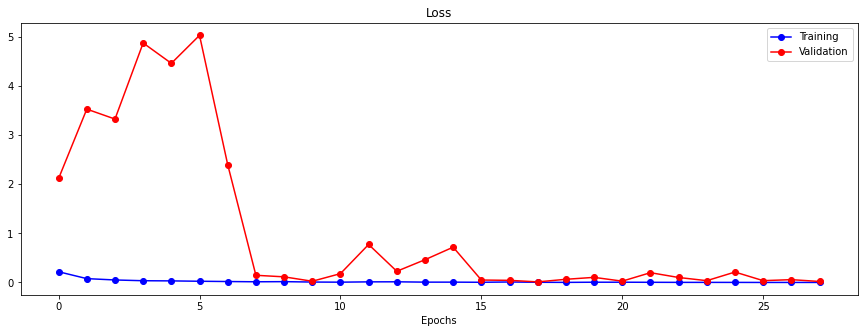

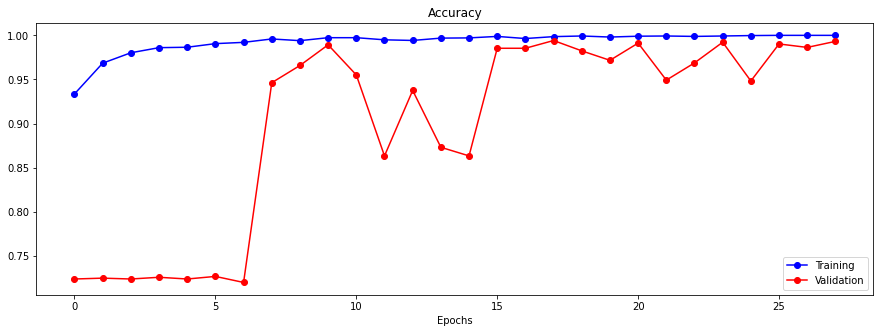

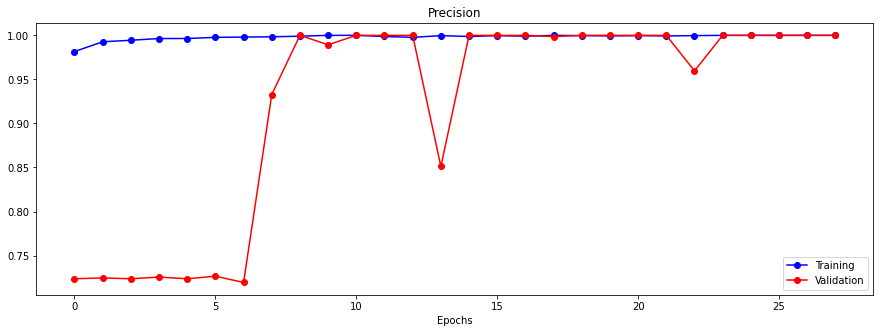

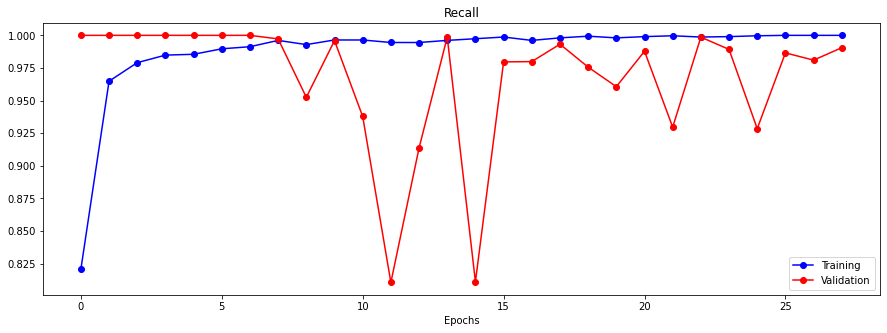

In [87]:
visualize_training_results(results_8)

In [88]:
# CREATE GENERATOR FOR TRAINING DATA (FROM train_df DATAFRAME)
resnet_train_eval_generator = ImageDataGenerator(rescale=1.0/255).flow_from_dataframe(
    dataframe=train_df, x_col='image', y_col='label',
    color_mode='rgb',    # 3 channels
    class_mode='raw',
    target_size=IMG_SIZE, 
    batch_size=BATCH_SIZE,
    seed=42,
    shuffle=False   # shuffle so we're not missing out on any samples
)

# CREATE GENERATOR FOR VALIDATION DATA (FROM val_df DATAFRAME)
resnet_val_eval_generator = ImageDataGenerator(rescale=1.0/255).flow_from_dataframe(
    dataframe=val_df, x_col='image', y_col='label',
    color_mode='rgb',    # 3 channels   
    class_mode='raw',
    target_size=IMG_SIZE, 
    batch_size=BATCH_SIZE,
    seed=42,
    shuffle=False
)

preds_train_8 = cnn_8.predict(resnet_train_eval_generator, 
                                steps=(resnet_train_eval_generator.n//BATCH_SIZE+1), 
                                verbose=1,
                                workers=8)
preds_val_8 = cnn_8.predict(resnet_val_eval_generator, 
                              steps=(resnet_val_eval_generator.n//BATCH_SIZE+1),
                              verbose=1,
                              workers=8)

Found 4185 validated image filenames.
Found 1047 validated image filenames.
33/33 [==============================] - ETA:  - 9s 185ms/step


In [89]:
cnn_8_metrics = cnn_8.evaluate(resnet_val_eval_generator)

33/33 [==============================] - 10s 307ms/step - loss: 0.0125 - accuracy: 0.9943 - recall: 0.9934 - precision: 0.9987


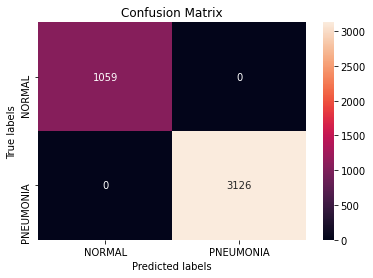

In [91]:
plot_confusionmatrix(train_df['label'], np.rint(preds_train_8))

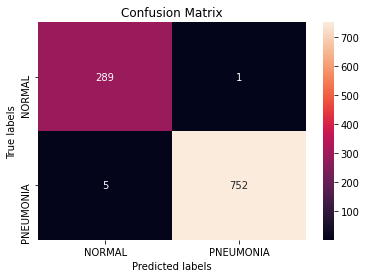

In [93]:
plot_confusionmatrix(val_df['label'], np.rint(preds_val_8))

In [94]:
# SAVE MODEL 7
cnn_8.save("cnn_8.h5")

### Evaluating on Test Set

#### Model 7

In [67]:
# CREATE GENERATOR FOR VALIDATION DATA (FROM test_df DATAFRAME)
resnet_test_generator = ImageDataGenerator(rescale=1.0/255).flow_from_dataframe(
    dataframe=test_df, x_col='image', y_col='label',
    color_mode='rgb',    # 3 channels   
    class_mode='raw',
    target_size=IMG_SIZE, 
    batch_size=BATCH_SIZE,
    seed=42,
    shuffle=False
)

Found 624 validated image filenames.


In [205]:
preds_test_7 = cnn_7.predict(resnet_test_generator, 
                             steps=(resnet_test_generator.n//BATCH_SIZE+1),
                             verbose=1,
                             workers=8)

20/20 [==============================] - 5s 145ms/step


In [206]:
cnn_7.evaluate(resnet_test_generator)

20/20 [==============================] - 5s 256ms/step - loss: 1.8089 - accuracy: 0.7628 - recall: 0.9974 - precision: 0.7257


[1.8089349269866943,
 0.7628205418586731,
 0.9974358677864075,
 0.7257462739944458]

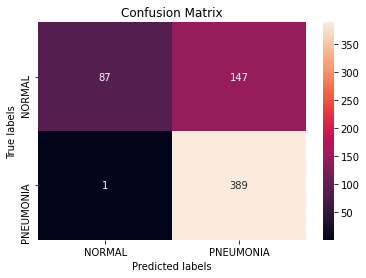

In [207]:
plot_confusionmatrix(test_df['label'], np.rint(preds_test_7))

In [210]:
# SAVE DATAFRAMES 
val_df.to_pickle('../working/val_df.pkl')
perf_df.to_pickle('../working/performance_df.pkl')

In [211]:
test_df['preds'] = preds_test_7

In [214]:
test_df[(test_df.label - np.rint(test_df.preds)) == 1]

,image,label,preds
245,../input/chest-xray-pneumonia/chest_xray/test/...,1,0.461615


Even on the 1 False Negative case, the probability is still very close to the threshold (0.461615 compared to 0.5). 

In [215]:
test_df.to_pickle('../working/test_df.pkl')

#### Model 8

In [90]:
# TESTING cnn_8 ON TEST SET
cnn_8_metrics = cnn_8.evaluate(resnet_test_generator)

20/20 [==============================] - 5s 255ms/step - loss: 1.6513 - accuracy: 0.7804 - recall: 0.9974 - precision: 0.7410
